<a href="https://colab.research.google.com/github/rlskoeser/shxco-missingdata-specreading/blob/main/missing-data/Sco_prophet_missingdata_weekly.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Predict Weekly Missing Data from Shakespeare and Company Project 

## Setup Libraries and Load S&Co Data



In [ ]:
%%capture
try:
    import prophet
except ImportError:
    # If prophet is not installed, install it. We usually used Prophet in Google Colab.
    !pip install prophet

In [15]:
import pandas as pd
import requests
from datetime import timedelta, datetime, date
from datetimerange import DateTimeRange
import math
import warnings
warnings.filterwarnings('ignore')
import altair as alt
alt.data_transformers.disable_max_rows()

from prophet import Prophet

In [2]:
# use v1.2 datasets; load from our repo for convenience
csv_urls = {
    # official published versions 
    'members': 'https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/source-data/SCoData_members_v1.2_2022-01.csv',
    'books': 'https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/source-data/SCoData_books_v1.2_2022-01.csv',
    'events': 'https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/source-data/SCoData_events_v1.2_2022-01.csv',

    # project-specific data
    'partial_borrowers': 'https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/partial_borrowers_collapsed.csv',
    'borrow_overrides': 'https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/long_borrow_overrides.csv'
}

In [3]:
# load events
events_df = pd.read_csv(csv_urls['events'], low_memory=False)

## Prepare logbook event data

Logbooks are one of the primary sources of data for the S&Co Project, and detail the membership, renewal, and reimbursement activities. You can read more about them on the Project website [https://shakespeareandco.princeton.edu/sources/logbooks/](https://shakespeareandco.princeton.edu/sources/logbooks/).

In [5]:
# identify to logbook events

logbook_events_df = events_df[events_df.source_type.str.contains('Logbook')][[
   'event_type', 'start_date', 'end_date', 'subscription_purchase_date',
   'member_uris', 'member_names',
   'subscription_duration', 'subscription_duration_days',
   'subscription_volumes', 'subscription_category',
   'source_type'
]]

# May need to add format="mixed" depending on platform
logbook_events_df['start_date'] = pd.to_datetime(logbook_events_df['start_date'])
logbook_events_df['subscription_purchase_date'] = pd.to_datetime(logbook_events_df['subscription_purchase_date'])
logbook_events_df['logbook_date'] = logbook_events_df.apply(lambda row: row.subscription_purchase_date if pd.notna(row.subscription_purchase_date) else row.start_date, axis=1)


In [6]:
def earliest_date(row):
  # earliest date is the start date, subscription purchase date, or end date
  dates = [val for val in [row.start_date, row.subscription_purchase_date, row.end_date] if not pd.isna(val)]
  if dates:
    return min(dates)

membership_events = events_df[events_df.event_type.isin(['Renewal', 'Subscription', 'Reimbursement' ,'Supplement', 'Separate Payment'])]
nonlogbook_membership_events = membership_events[~membership_events.source_type.str.contains('Logbook')]
membership_events['earliest_date'] = membership_events.apply(earliest_date, axis=1)
membership_events['date'] = pd.to_datetime(membership_events['earliest_date'], errors='coerce')

## Calculate logbook gaps

While much of the membership data is consistent, there are periods where there are gaps in the data, largely for archival reasons. We have calculated these gaps and now can explore their distribution.

In [7]:
response = requests.get('https://raw.githubusercontent.com/rlskoeser/shxco-missingdata-specreading/main/data/logbook-dates.json')
logbook_dates = response.json()

In [8]:
# don't consider gaps shorter than 15 days
MIN_GAP_DAYS = 15

logbook_gaps = []
skipped_gaps = []

oneday = timedelta(days=1)


for i in range(len(logbook_dates) - 1):
  # gaps are between the logbook dates, so gap start is end of the first
  # and gap end is the start of the next

  # gap start and end dates are now included in the range instead of bounds outside the range
  gap_start = pd.to_datetime(logbook_dates[i]['endDate']) + oneday
  gap_end = pd.to_datetime(logbook_dates[i+1]['startDate']) - oneday
  interval = { 'start': gap_start, 'end': gap_end, 'days': (gap_end - gap_start).days }

  if interval['days'] > MIN_GAP_DAYS:
      logbook_gaps.append(interval) 
  elif interval['days'] > 0:  # ignore 0 and -1 duration "gaps"!
     skipped_gaps.append(interval)


print(f"The {len(logbook_gaps)} large gaps in the logbooks")
for interval in logbook_gaps:
    print(f"\t{interval['start'].strftime('%B %d %Y')} to {interval['end'].strftime('%B %d %Y')} ({interval['days']} days)")

print(f"\nThe {len(skipped_gaps)} small gaps in the logbooks that will be skipped")
for interval in skipped_gaps:
    print(f"\t{interval['start'].strftime('%B %d %Y')} to {interval['end'].strftime('%B %d %Y')} ({interval['days']} day{'s' if interval['days'] != 1 else ''})")

The 6 large gaps in the logbooks
	January 01 1928 to February 29 1928 (59 days)
	January 03 1930 to June 01 1930 (149 days)
	August 01 1930 to December 31 1930 (152 days)
	February 17 1931 to September 25 1932 (586 days)
	January 01 1937 to February 16 1938 (411 days)
	May 06 1938 to October 20 1938 (167 days)

The 5 small gaps in the logbooks that will be skipped
	October 30 1927 to November 01 1927 (2 days)
	February 07 1934 to February 08 1934 (1 day)
	January 01 1935 to January 11 1935 (10 days)
	December 29 1935 to January 01 1936 (3 days)
	August 29 1939 to September 12 1939 (14 days)


In [9]:
# get logbook event data *except* for during gaps
# — v1.2 dataset has 9 stray events in these gaps; 8 misattributed to logbook source, one documented in a later logbook

logbook_events_nogaps = logbook_events_df.copy()

for i, gap in enumerate(logbook_gaps):
  gap_start = gap['start']
  gap_end = gap['end']
  logbook_events_nogaps = logbook_events_nogaps[~((logbook_events_nogaps.logbook_date >= gap_start) & (logbook_events_nogaps.logbook_date <= gap_end))]


# Missing membership events

## Logbook / membership events by week

In [10]:
logbooks_weekly_count = logbook_events_nogaps.groupby([pd.Grouper(key='logbook_date', freq='W')])['event_type'].count().reset_index()
logbooks_weekly_count.rename(columns={'event_type': 'total'}, inplace=True)

logbook_gaps_df = pd.DataFrame(logbook_gaps)
logbook_gaps_df['gap_label'] = logbook_gaps_df.apply(lambda row: '%s to %s (%d days)' % (row.start.date().isoformat(), row.end.date().isoformat(), row.days), axis=1)

In [22]:
base = alt.Chart(logbooks_weekly_count).encode(
    alt.X('logbook_date:T', axis=alt.Axis(title='date'))
).properties(
    width=1200,
    height=275
)

line = base.mark_line().encode(
    alt.Y('total',
          axis=alt.Axis(title='total events per week'))
)
# draw rectangles to highlight logbook gaps
logbook_gaps_span = alt.Chart(logbook_gaps_df).encode(
     alt.X('start')
).properties(
    width=1200,
    height=275
).mark_rect(
    opacity=0.2, color="gray"
).encode(
    x='start',
    x2='end',
    y=alt.value(0),  # 0 pixels from bottom
    y2=alt.value(275)  # 300 pixels from top
)


line + logbook_gaps_span

alt.LayerChart(...)

# missing members

## member data setup

In [23]:
# split multiple members for shared accounts in events
events_df[
    ["first_member_uri", "second_member_uri"]
] = events_df.member_uris.str.split(";", expand=True)

# working with the first member for now...
# generate short ids equivalent to those in member and book dataframes
events_df["member_id"] = events_df.first_member_uri.apply(
    lambda x: x.split("/")[-2]
)
events_df["item_id"] = events_df.item_uri.apply(
    lambda x: x.split("/")[-2] if pd.notna(x) else None
)

In [24]:
# looking at all the data, what is the first event for each member?
member_dates = events_df.copy()

# make sure each event has an earliest known date
def earliest_date(row):
  dates = [val for val in [row.start_date, row.subscription_purchase_date, row.end_date] if not pd.isna(val)]
  if dates:
    return min(dates)     

member_dates['earliest_date'] = member_dates.apply(earliest_date, axis=1)

In [25]:
# convert earliest date to datetime; convert partially known dates to -01-01  for now
member_dates['date'] = pd.to_datetime(member_dates['earliest_date'], errors='coerce')

In [26]:
# limit to the fields we want, drop unknown dates
members_added = member_dates[['event_type', 'member_id', 'date', 'source_type']].dropna(subset=['date'])


In [27]:
members_added = members_added[members_added['date'] < datetime(1942, 1, 1)]

In [28]:
# limit to member uri and date; then group by member and get the first date
members_grouped = members_added[["member_id", "date"]].groupby("member_id")
members_first_dates = members_grouped.first().reset_index()


In [29]:
newmember_yearly_count = members_first_dates.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
newmember_yearly_count.rename(columns={'member_id': 'total'}, inplace=True)


In [30]:
newmember_base = alt.Chart(newmember_yearly_count, title='new members by year').encode(
    alt.X('date:T', axis=alt.Axis(title='date'))
).properties(
    width=1200,
    height=275
)

newmember_line = newmember_base.mark_line().encode(
    alt.Y('total',
          axis=alt.Axis(title='new members by year'))
)
newmember_line

alt.Chart(...)

In [31]:
newmember_line + logbook_gaps_span

alt.LayerChart(...)

In [32]:
# group again but report on source and event type;
# customize sorting to order so subscriptions will show up first
from pandas.api.types import CategoricalDtype

# main order we care about is subscription first; other order matters less; reimbursement would be expected last
event_type = CategoricalDtype(categories=["Subscription", "Renewal", "Separate Payment", "Borrow", "Purchase", "Supplement", "Request", "Gift", "Crossed out", "Reimbursement"], ordered=True)
# copy member data frame, and convert event type to our new categorical type
member_events = members_added.copy()

member_events['event_type'] = member_events.event_type.astype(event_type)

# sort by date, then sort by event type so if there are any same-day events,
# subscription should always be first
member_events = member_events.sort_values(by=['date', 'event_type'])

members_first_events = member_events.groupby("member_id").first().reset_index()


In [33]:
# confirm the number of rows in the df == the number of unique members included
len(members_first_events.member_id.unique())

5085

In [34]:
# what is the breakdown of event types for first events?
members_first_events.event_type.value_counts()

Subscription        4189
Renewal              550
Reimbursement        208
Borrow                91
Purchase              18
Separate Payment      12
Supplement            10
Gift                   3
Crossed out            1
Request                0
Name: event_type, dtype: int64

In [35]:
# what about source of first events
members_first_events.source_type.value_counts()

Logbook                                      2744
Logbook;Address Book                         1375
Address Book                                  445
Logbook;Lending Library Card                  242
Lending Library Card                          220
Lending Library Card;Address Book              22
Logbook;Lending Library Card;Address Book      19
Lending Library Card;Logbook                   15
Lending Library Card;Lending Library Card       2
Lending Library Card;Logbook;Address Book       1
Name: source_type, dtype: int64

### new members added, logbooks only

In [36]:
# get first events for each member from logbooks only

# go back to member events, limit to logbook events, then group and get first event
logbook_first_events = member_events[member_events.source_type.str.contains('Logbook')].groupby("member_id").first().reset_index()


In [37]:
# confirm one row per member
len(logbook_first_events.member_id.unique())

4597

In [38]:
# check source type breakdown
logbook_first_events.source_type.value_counts()

Logbook                                              2828
Logbook;Address Book                                 1412
Logbook;Lending Library Card                          309
Logbook;Lending Library Card;Address Book              25
Lending Library Card;Logbook                           20
Logbook;Lending Library Card;Lending Library Card       1
Logbook;Address Book;Lending Library Card               1
Lending Library Card;Logbook;Address Book               1
Name: source_type, dtype: int64

In [39]:
# get new member yearly count for logbook-sourced events only 
logbook_newmembers_by_year = logbook_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
logbook_newmembers_by_year.rename(columns={'member_id': 'total'}, inplace=True)
logbook_newmembers_by_year

,date,total
0,1919-12-31,53
1,1920-12-31,193
2,1921-12-31,278
3,1922-12-31,322
4,1923-12-31,280
5,1924-12-31,325
6,1925-12-31,404
7,1926-12-31,436
8,1927-12-31,296
9,1928-12-31,289


In [40]:
logbook_newmember_base = alt.Chart(logbook_newmembers_by_year, title='new members by year').encode(
    alt.X('date:T', axis=alt.Axis(title='date'))
).properties(
    width=1200,
    height=275
)

logbook_newmember_line = logbook_newmember_base.mark_line(color="purple").encode(
    alt.Y('total',
          axis=alt.Axis(title='new members by year'))
)
newmember_line + logbook_newmember_line

alt.LayerChart(...)

### aggregate by month instead of year

confusing because totals and graphs in the dataset essay are monthly, it looks wrong

In [41]:
# get new member monthly count for logbook-sourced events only 
logbook_newmembers_by_month = logbook_first_events.groupby([pd.Grouper(key='date', freq='M')])['member_id'].count().reset_index()
logbook_newmembers_by_month.rename(columns={'member_id': 'total'}, inplace=True)
logbook_newmembers_by_month

,date,total
0,1919-11-30,23
1,1919-12-31,30
2,1920-01-31,28
3,1920-02-29,19
4,1920-03-31,20
...,...,...
261,1941-08-31,1
262,1941-09-30,17
263,1941-10-31,26
264,1941-11-30,21


In [42]:
logbook_newmember_monthly_base = alt.Chart(logbook_newmembers_by_month, title='new members by month').encode(
    alt.X('date:T', axis=alt.Axis(title='date'))
).properties(
    width=1200,
    height=275
)

logbook_newmember_monthly_line = logbook_newmember_monthly_base.mark_line(color="purple", opacity=0.5).encode(
    alt.Y('total',
          axis=alt.Axis(title='new members by month'))
)
logbook_newmember_monthly_line

alt.Chart(...)

In [43]:
newmember_monthly_count = members_first_dates.groupby([pd.Grouper(key='date', freq='M')])['member_id'].count().reset_index()
newmember_monthly_count.rename(columns={'member_id': 'total'}, inplace=True)
newmember_monthly_count

,date,total
0,1919-11-30,17
1,1919-12-31,23
2,1920-01-31,25
3,1920-02-29,18
4,1920-03-31,23
...,...,...
261,1941-08-31,1
262,1941-09-30,18
263,1941-10-31,25
264,1941-11-30,23


In [44]:
newmember_monthly_base = alt.Chart(newmember_monthly_count, title='new members by month').encode(
    alt.X('date:T', axis=alt.Axis(title='date'))
).properties(
    width=1200,
    height=275
)

newmember_monthly_line = newmember_monthly_base.mark_line(opacity=0.5).encode(
    alt.Y('total',
          axis=alt.Axis(title='new members by month'))
)
newmember_monthly_line

alt.Chart(...)

In [45]:
logbook_newmember_monthly_line + newmember_monthly_line

alt.LayerChart(...)

### members only documented in address books

In [46]:
# what about members we _only_ know about from the address books?

# any member with at least one event in the logbooks
logbook_members = member_events[member_events.source_type.str.contains('Logbook')].member_id.unique()
# any member with at least one event on a card
lending_card_members = member_events[member_events.source_type.str.contains('Lending Library Card')].member_id.unique()
# any member with at least one event from an address book
addressbook_members = member_events[member_events.source_type.str.contains('Address Book')].member_id.unique()

# get a list of address-book-only members 
address_book_only_members = set(member_events.member_id.unique()) - set(logbook_members) - set(lending_card_members)
print('%d members who only have events from the address books' % len(address_book_only_members))


329 members who only have events from the address books


In [47]:
# check logic
member_events[member_events.member_id.isin(address_book_only_members)]

,event_type,member_id,date,source_type
216,Subscription,boue-l,1920-03-01,Address Book
224,Subscription,dunlap-sheila,1920-10-01,Address Book
228,Subscription,grant-mrs-robert,1921-01-01,Address Book
233,Subscription,madam-g-s,1921-07-01,Address Book
4,Subscription,lincoln-1,1922-01-01,Address Book
...,...,...,...,...
20967,Subscription,stavis-barrie,1937-07-03,Address Book
20997,Subscription,baumel-germaine,1937-07-07,Address Book
21000,Subscription,ruellan-severine,1937-07-08,Address Book
21001,Subscription,matthews-sylvia,1937-07-08,Address Book


In [48]:
member_events[member_events.member_id.isin(address_book_only_members)].source_type.describe()

count              365
unique               1
top       Address Book
freq               365
Name: source_type, dtype: object

In [49]:
# get date added for address-only members

addressbook_first_events = member_events[member_events.member_id.isin(address_book_only_members)].groupby("member_id").first().reset_index()
addressbook_first_events

,member_id,event_type,date,source_type
0,abbott-berenice,Subscription,1926-09-01,Address Book
1,abrahams,Subscription,1937-06-29,Address Book
2,abrami,Subscription,1937-02-05,Address Book
3,agard-walter,Subscription,1932-01-01,Address Book
4,aguilar-anina-de,Subscription,1931-01-01,Address Book
...,...,...,...,...
324,venturi-franco,Subscription,1937-01-12,Address Book
325,wallace-michael,Subscription,1937-04-02,Address Book
326,wicks,Subscription,1937-04-08,Address Book
327,young-g,Subscription,1937-05-10,Address Book


In [50]:
# get new member yearly count for addressbook-only members events only 
addressbook_newmembers_by_year = addressbook_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
addressbook_newmembers_by_year.rename(columns={'member_id': 'total'}, inplace=True)
addressbook_newmembers_by_year

,date,total
0,1920-12-31,2
1,1921-12-31,2
2,1922-12-31,9
3,1923-12-31,8
4,1924-12-31,8
5,1925-12-31,7
6,1926-12-31,13
7,1927-12-31,17
8,1928-12-31,16
9,1929-12-31,18


In [51]:
addressbook_newmembers_by_year.total.sum()

329

### members only documented on lending cards

In [52]:
# do we have any lending-card only members?

# get a list of address-book-only members 
lending_card_only_members = set(member_events.member_id.unique()) - set(logbook_members) - set(addressbook_members)
print('%d members who only have events from lending library cards' % len(lending_card_only_members))


124 members who only have events from lending library cards


In [53]:
# check logic
member_events[member_events.member_id.isin(lending_card_only_members)]

,event_type,member_id,date,source_type
705,Borrow,winger,1919-12-02,Lending Library Card
706,Borrow,winger,1919-12-02,Lending Library Card
751,Borrow,winger,1920-01-05,Lending Library Card
752,Borrow,winger,1920-01-05,Lending Library Card
774,Borrow,winger,1920-01-16,Lending Library Card
...,...,...,...,...
29423,Borrow,woodward-daphne,1941-12-08,Lending Library Card
29445,Borrow,valery-francois,1941-12-12,Lending Library Card
29451,Borrow,valery-francois,1941-12-12,Lending Library Card
29459,Borrow,valery-francois,1941-12-12,Lending Library Card


In [54]:
cardonly_members = member_events[member_events.member_id.isin(lending_card_only_members)]
cardonly_members['year'] = cardonly_members.date.apply(lambda x: x.year)
cardonly_members.year.unique()

array([1919, 1920, 1922, 1923, 1924, 1925, 1927, 1928, 1929, 1930, 1931,
       1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941])

In [55]:
# card-only member first events
cardonly_first_events = member_events[member_events.member_id.isin(lending_card_only_members)].groupby("member_id").first().reset_index()
cardonly_first_events

,member_id,event_type,date,source_type
0,beach-family,Gift,1930-12-01,Lending Library Card
1,benjamin-walter,Borrow,1940-02-23,Lending Library Card
2,bernheim-antoinette,Borrow,1934-10-23,Lending Library Card
3,bertrand-fontaine-therese,Borrow,1938-01-01,Lending Library Card
4,bird,NaN,1933-03-29,Lending Library Card
...,...,...,...,...
119,williamson-scott-graham,Borrow,1934-09-24,Lending Library Card
120,winger,Borrow,1919-12-02,Lending Library Card
121,wissotzky,Subscription,1937-11-04,Lending Library Card
122,woodward-daphne,Borrow,1940-08-28,Lending Library Card


In [56]:
# get new member yearly count for lending card-only members
cardonly_newmembers_by_year = cardonly_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
cardonly_newmembers_by_year.rename(columns={'member_id': 'total'}, inplace=True)
cardonly_newmembers_by_year

,date,total
0,1919-12-31,1
1,1920-12-31,1
2,1921-12-31,0
3,1922-12-31,3
4,1923-12-31,1
5,1924-12-31,0
6,1925-12-31,2
7,1926-12-31,0
8,1927-12-31,4
9,1928-12-31,5


### other members

In [57]:
# get all other members so we can generate stacked area chart properly

other_members = set(member_events.member_id.unique()) - set(lending_card_only_members) - set(address_book_only_members)
print('%d "regular" members (not addressbook or lending card only)' % len(other_members))
 

4632 "regular" members (not addressbook or lending card only)


In [58]:
# other member first events
other_member_first_events = member_events[member_events.member_id.isin(other_members)].groupby("member_id").first().reset_index()
other_member_first_events

,member_id,event_type,date,source_type
0,Cahn-1,Subscription,1919-12-27,Logbook
1,Clauebou-1,Subscription,1941-11-26,Logbook
2,Edward,Renewal,1941-01-22,Logbook
3,Tyson,Reimbursement,1938-03-15,Logbook
4,abbott,Subscription,1925-04-21,Logbook;Address Book
...,...,...,...,...
4627,zimmer,Subscription,1920-01-16,Logbook;Lending Library Card
4628,zogheb,Borrow,1940-01-05,Lending Library Card
4629,zongenth,Subscription,1926-11-03,Logbook
4630,zueblin,Subscription,1922-10-18,Logbook


In [59]:
# new member yearly count 
other_newmembers_by_year = other_member_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
other_newmembers_by_year.rename(columns={'member_id': 'total'}, inplace=True)
other_newmembers_by_year

,date,total
0,1919-12-31,53
1,1920-12-31,194
2,1921-12-31,282
3,1922-12-31,318
4,1923-12-31,283
5,1924-12-31,324
6,1925-12-31,406
7,1926-12-31,437
8,1927-12-31,298
9,1928-12-31,295


In [60]:
# plot all three sets of new members together

# combine into a single df for plotting with altair

def combine_newmember_counts():
  # new_member_counts = newmember_yearly_count.copy()
  # new_member_counts['series'] = 'all events'

  # FIXME: this is not plotting the same thing as the others!
  # logbook_newmembers = logbook_newmembers_by_year.copy()
  # logbook_newmembers['series'] = 'logbook events only'

  other_newmembers = other_newmembers_by_year.copy()
  other_newmembers['series'] = 'all other members'

  addressbook_newmembers = addressbook_newmembers_by_year.copy()
  addressbook_newmembers['series'] = 'addressbook-only members'
  
  card_newmembers = cardonly_newmembers_by_year.copy()
  card_newmembers['series'] = 'card-only members'
  
  # combined_new_member_counts_df = pd.concat([new_member_counts, logbook_newmembers, addressbook_newmembers])
  combined_new_member_counts_df = pd.concat([other_newmembers, addressbook_newmembers, card_newmembers])

  return combined_new_member_counts_df

combine_newmember_counts_df = combine_newmember_counts()
combine_newmember_counts_df


# # clear from any previous run
# plt.clf()
# # setup shared axis
# fig, ax = plt.subplots(figsize=(20, 5))

# sns.lineplot(data=newmember_yearly_count, x='date', y='total', label='new members (all events)')
# sns.lineplot(data=logbook_newmembers_by_year, x='date', y='total', label='new members (logbook events only)')
# sns.lineplot(data=addressbook_newmembers_by_year, x='date', y='total', label='new members (addressbook-only members)')

# for i, gap in enumerate(logbook_gaps): 
#   gap_start = pd.to_datetime(gap['start'])
#   gap_end = pd.to_datetime(gap['end'])
#   ax.axvspan(gap_start, gap_end, color="gray", alpha=0.2)

,date,total,series
0,1919-12-31,53,all other members
1,1920-12-31,194,all other members
2,1921-12-31,282,all other members
3,1922-12-31,318,all other members
4,1923-12-31,283,all other members
...,...,...,...
18,1937-12-31,12,card-only members
19,1938-12-31,20,card-only members
20,1939-12-31,5,card-only members
21,1940-12-31,6,card-only members


In [61]:
domain = ['addressbook-only members', 'card-only members', 'all other members']
range_ = ['#d7191c', '#fdae61', '#2c7bb6']

newmember_stacked = alt.Chart(combine_newmember_counts_df, title='new members by source').mark_area(opacity=0.5).encode(
    x="date:T",
    y="total",
    color=alt.Color("series", legend=alt.Legend(title="member group"), scale=alt.Scale(domain=domain, range=range_))
).properties(
    width=1200,
    height=275
)
newmember_stacked

alt.Chart(...)

In [62]:
newmember_stacked + newmember_line + logbook_newmember_line

alt.LayerChart(...)

In [63]:
newmember_stacked + newmember_line + logbook_newmember_line + logbook_gaps_span

alt.LayerChart(...)

### aggregate new members from source by month

In [64]:
# get new member monthly count for addressbook-only members events only 
addressbook_newmembers_by_month = addressbook_first_events.groupby([pd.Grouper(key='date', freq='M')])['member_id'].count().reset_index()
addressbook_newmembers_by_month.rename(columns={'member_id': 'total'}, inplace=True)
addressbook_newmembers_by_month

,date,total
0,1920-03-31,1
1,1920-04-30,0
2,1920-05-31,0
3,1920-06-30,0
4,1920-07-31,0
...,...,...
204,1937-03-31,11
205,1937-04-30,12
206,1937-05-31,5
207,1937-06-30,10


In [65]:
# get new member monthly count for lending card-only members
cardonly_newmembers_by_month = cardonly_first_events.groupby([pd.Grouper(key='date', freq='M')])['member_id'].count().reset_index()
cardonly_newmembers_by_month.rename(columns={'member_id': 'total'}, inplace=True)
cardonly_newmembers_by_month

,date,total
0,1919-12-31,1
1,1920-01-31,0
2,1920-02-29,0
3,1920-03-31,0
4,1920-04-30,0
...,...,...
257,1941-05-31,0
258,1941-06-30,0
259,1941-07-31,0
260,1941-08-31,0


In [66]:
# new member monthly count 
other_newmembers_by_month = other_member_first_events.groupby([pd.Grouper(key='date', freq='M')])['member_id'].count().reset_index()
other_newmembers_by_month.rename(columns={'member_id': 'total'}, inplace=True)
other_newmembers_by_month

,date,total
0,1919-11-30,23
1,1919-12-31,30
2,1920-01-31,28
3,1920-02-29,19
4,1920-03-31,21
...,...,...
261,1941-08-31,1
262,1941-09-30,17
263,1941-10-31,26
264,1941-11-30,21


In [67]:
# combine into a single df for plotting with altair

def combine_newmember_monthly_counts():
  # new_member_counts = newmember_yearly_count.copy()
  # new_member_counts['series'] = 'all events'

  # FIXME: this is not plotting the same thing as the others!
  # logbook_newmembers = logbook_newmembers_by_year.copy()
  # logbook_newmembers['series'] = 'logbook events only'

  other_newmembers = other_newmembers_by_month.copy()
  other_newmembers['series'] = 'all other members'

  addressbook_newmembers = addressbook_newmembers_by_month.copy()
  addressbook_newmembers['series'] = 'addressbook-only members'
  
  card_newmembers = cardonly_newmembers_by_month.copy()
  card_newmembers['series'] = 'card-only members'
  
  # combined_new_member_counts_df = pd.concat([new_member_counts, logbook_newmembers, addressbook_newmembers])
  combined_new_member_counts_df = pd.concat([other_newmembers, addressbook_newmembers, card_newmembers])

  return combined_new_member_counts_df

combine_newmember_monthly_counts_df = combine_newmember_monthly_counts()
combine_newmember_monthly_counts_df


,date,total,series
0,1919-11-30,23,all other members
1,1919-12-31,30,all other members
2,1920-01-31,28,all other members
3,1920-02-29,19,all other members
4,1920-03-31,21,all other members
...,...,...,...
257,1941-05-31,0,card-only members
258,1941-06-30,0,card-only members
259,1941-07-31,0,card-only members
260,1941-08-31,0,card-only members


In [68]:
domain = ['addressbook-only members', 'card-only members', 'all other members']
range_ = ['#d7191c', '#fdae61', '#2c7bb6']

newmember_monthly_stacked = alt.Chart(combine_newmember_monthly_counts_df, title='new members by source').mark_area(opacity=0.5).encode(
    x="date:T",
    y="total",
    color=alt.Color("series", legend=alt.Legend(title="member group"), scale=alt.Scale(domain=domain, range=range_))
).properties(
    width=1200,
    height=275
)
newmember_monthly_stacked

alt.Chart(...)

In [69]:
newmember_monthly_stacked + newmember_monthly_line + logbook_newmember_monthly_line

alt.LayerChart(...)

In [70]:
newmember_monthly_stacked + newmember_monthly_line + logbook_newmember_monthly_line + logbook_gaps_span

alt.LayerChart(...)

## new members by first subscription

In [72]:
# to model properly, we only expect membership to start with a subscription
# include renewals, since sometimes they were written down for each other

# go back to member events, limit to logbooks AND by event type, then group and get first event for each member
subscription_first_events = member_events[member_events.source_type.str.contains('Logbook') & member_events.event_type.isin(['Subscription', 'Renewal'])].groupby("member_id").first().reset_index()
subscription_first_events

,member_id,event_type,date,source_type
0,Cahn-1,Subscription,1919-12-27,Logbook
1,Clauebou-1,Subscription,1941-11-26,Logbook
2,Edward,Renewal,1941-01-22,Logbook
3,abbott,Subscription,1925-04-21,Logbook;Address Book
4,abdul,Subscription,1941-11-27,Logbook
...,...,...,...,...
4315,zimmer,Subscription,1920-01-16,Logbook;Lending Library Card
4316,zogheb,Subscription,1940-01-31,Logbook;Lending Library Card
4317,zongenth,Subscription,1926-11-03,Logbook
4318,zueblin,Subscription,1922-10-18,Logbook


In [73]:
len(subscription_first_events.member_id.unique())

4320

In [74]:
# exclude from gaps, just in case

subscription_first_events_nogaps = subscription_first_events.copy()

for i, gap in enumerate(logbook_gaps):
  gap_start = gap['start']
  gap_end = gap['end']
  subscription_first_events_nogaps = subscription_first_events_nogaps[~((subscription_first_events_nogaps.date >= gap_start) & (subscription_first_events_nogaps.date <= gap_end))]

len(subscription_first_events_nogaps.member_id.unique())

4315

In [75]:
# get new member yearly count based only on subscriptions
# newmember_subscriptions_by_year = subscription_first_events.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()

newmember_subscriptions_by_year = subscription_first_events_nogaps.groupby([pd.Grouper(key='date', freq='Y')])['member_id'].count().reset_index()
newmember_subscriptions_by_year.rename(columns={'member_id': 'total'}, inplace=True)
newmember_subscriptions_by_year

,date,total
0,1919-12-31,53
1,1920-12-31,192
2,1921-12-31,278
3,1922-12-31,320
4,1923-12-31,275
5,1924-12-31,319
6,1925-12-31,395
7,1926-12-31,400
8,1927-12-31,276
9,1928-12-31,260


In [76]:
# get new member monthly count based only on subscriptions, so we can forecast with prophet
newmember_subscriptions_by_week = subscription_first_events_nogaps.groupby([pd.Grouper(key='date', freq='W')])['member_id'].count().reset_index()
newmember_subscriptions_by_week.rename(columns={'member_id': 'total'}, inplace=True)
newmember_subscriptions_by_week

,date,total
0,1919-11-23,12
1,1919-11-30,11
2,1919-12-07,12
3,1919-12-14,6
4,1919-12-21,4
...,...,...
1147,1941-11-16,4
1148,1941-11-23,1
1149,1941-11-30,9
1150,1941-12-07,3


In [77]:
# plot new subscriptions logbooks with gaps


newsubs_base = alt.Chart(newmember_subscriptions_by_week).encode(
    alt.X('date:T', axis=alt.Axis(title='date'))
).properties(
    width=1200,
    height=275
)

newsubs_line = newsubs_base.mark_line().encode(
    alt.Y('total',
          axis=alt.Axis(title='new subscriptions per week'))
)
newsubs_line + logbook_gaps_span

alt.LayerChart(...)

### use prophet to forecast missing subscriptions

In [79]:
from datetime import date, timedelta
import math

from prophet import Prophet

post1932 = pd.to_datetime(date(1932, 9, 27))


def forecast_missing_newsubs():
  # show some number of months before/after the gap and forecast
  oneweek = timedelta(days=7)

  # lists to aggregate forecasts and models
  all_newsub_weekly_forecasts_dfs = []

  # there's a significant difference between 1920s and 1930s data,
  # and there's a big gap in 1931-1932
  # for gaps after 1936, only include counts after the 1932 gap
  #   February 16 1931 to September 26 1932 (588 days)
  #   December 31 1936 to February 17 1938 (413 days)

  post1932 = pd.to_datetime(date(1932, 9, 27))

  for i, gap in enumerate(logbook_gaps):
    weekly_m = Prophet()
    gap_start = gap['start']
    gap_end = gap['end']
    print('forecasting %s' % gap)

    preceding_data = newmember_subscriptions_by_week[newmember_subscriptions_by_week.date < gap_start]

    # for late gaps, only include counts after september 1932
    if gap_start.year >= 1936:
      preceding_data = preceding_data[preceding_data.date >= post1932 ]

    # drop any zeroes, so prophet doesn't fit to missing data
    # preceding_data = preceding_data[preceding_data.total.gt(0)]

    # rename monthly count columns for prophet and fit the data
    weekly_m.fit(preceding_data.rename(columns={'date': 'ds', 'total': 'y'}))

    # make a future dataframe to cover the gap 
    # (need at least 1 extra; may want to add more while testing)
    forecast_for = math.ceil(gap['days']/ 7) + 7
    print('gap is %s days, forecast for %d weeks' % (gap['days'], forecast_for))
    newsub_weeks_future = weekly_m.make_future_dataframe(periods=forecast_for, freq='W')
    newsub_weeks_fcst = weekly_m.predict(newsub_weeks_future)

    # plot the forecast around our gap
    forecast_near_gap = newsub_weeks_fcst[(newsub_weeks_fcst.ds > (gap_start - oneweek)) & (newsub_weeks_fcst.ds < (gap_end + oneweek))]
    display(forecast_near_gap.head())
    # all_gap_forecasts_dfs.append(forecast_near_gap)

    newsub_weekly_count_near_gap = newmember_subscriptions_by_week[(newmember_subscriptions_by_week.date > (gap_start - oneweek)) & (newmember_subscriptions_by_week.date < (gap_end + oneweek))]

    forecast_near_gap = newsub_weeks_fcst[(newsub_weeks_fcst.ds > (gap_start - oneweek)) & (newsub_weeks_fcst.ds < (gap_end + oneweek))]

    all_newsub_weekly_forecasts_dfs.append(newsub_weeks_fcst.copy())

  # combine all the forecasts into a single df
  newsub_weekly_forecasts_dfs = pd.concat(all_newsub_weekly_forecasts_dfs)
  # all_gap_forecasts = pd.concat(all_gap_forecasts_dfs)

  return newsub_weekly_forecasts_dfs


newsub_weekly_forecasts = forecast_missing_newsubs()
newsub_weekly_forecasts

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/z48murzd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/dy7ou64a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16879', 'data', 'file=/tmp/tmp1mhj93z6/z48murzd.json', 'init=/tmp/tmp1mhj93z6/dy7ou64a.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_models8iw36mk/prophet_model-20230113165942.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:59:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1928-01-01 00:00:00'), 'end': Timestamp('1928-02-29 00:00:00'), 'days': 59}


16:59:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 59 days, forecast for 16 weeks


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
423,1928-01-01,6.248944,3.039637,9.833827,6.248944,6.248944,0.068042,0.068042,0.068042,0.068042,0.068042,0.068042,0.0,0.0,0.0,6.316987
424,1928-01-08,6.242323,3.139724,10.150563,6.242323,6.242323,0.347586,0.347586,0.347586,0.347586,0.347586,0.347586,0.0,0.0,0.0,6.589909
425,1928-01-15,6.235702,3.639934,10.249417,6.235702,6.235707,0.778501,0.778501,0.778501,0.778501,0.778501,0.778501,0.0,0.0,0.0,7.014203
426,1928-01-22,6.229081,4.422933,10.938900,6.229066,6.229303,1.345514,1.345514,1.345514,1.345514,1.345514,1.345514,0.0,0.0,0.0,7.574595
427,1928-01-29,6.222460,4.328028,11.272008,6.222299,6.222911,1.602948,1.602948,1.602948,1.602948,1.602948,1.602948,0.0,0.0,0.0,7.825408


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/bfl5ehr7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/5lbvz2ik.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95762', 'data', 'file=/tmp/tmp1mhj93z6/bfl5ehr7.json', 'init=/tmp/tmp1mhj93z6/5lbvz2ik.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_model4z6b3zbn/prophet_model-20230113165943.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:59:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:59:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1930-01-03 00:00:00'), 'end': Timestamp('1930-06-01 00:00:00'), 'days': 149}
gap is 149 days, forecast for 29 weeks


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
527,1929-12-29,4.540732,0.880099,7.905466,4.540732,4.540732,-0.282093,-0.282093,-0.282093,-0.282093,-0.282093,-0.282093,0.0,0.0,0.0,4.258639
528,1930-01-05,4.529205,1.021626,7.972159,4.529205,4.529205,-0.182096,-0.182096,-0.182096,-0.182096,-0.182096,-0.182096,0.0,0.0,0.0,4.347109
529,1930-01-12,4.517678,1.302952,8.337690,4.517678,4.517678,0.061252,0.061252,0.061252,0.061252,0.061252,0.061252,0.0,0.0,0.0,4.578929
530,1930-01-19,4.506151,1.376713,8.499891,4.506151,4.506151,0.505738,0.505738,0.505738,0.505738,0.505738,0.505738,0.0,0.0,0.0,5.011889
531,1930-01-26,4.494624,1.739789,8.649196,4.494624,4.494624,0.851413,0.851413,0.851413,0.851413,0.851413,0.851413,0.0,0.0,0.0,5.346037


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/7c9rhufq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/d_iijy3y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50755', 'data', 'file=/tmp/tmp1mhj93z6/7c9rhufq.json', 'init=/tmp/tmp1mhj93z6/d_iijy3y.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_model9p8riq23/prophet_model-20230113165944.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:59:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1930-08-01 00:00:00'), 'end': Timestamp('1930-12-31 00:00:00'), 'days': 152}


16:59:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 152 days, forecast for 29 weeks


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
557,1930-07-27,2.930704,-1.419351,5.441325,2.930704,2.930704,-0.856776,-0.856776,-0.856776,-0.856776,-0.856776,-0.856776,0.0,0.0,0.0,2.073928
558,1930-08-03,2.912309,-1.824567,5.457127,2.912309,2.912309,-0.984005,-0.984005,-0.984005,-0.984005,-0.984005,-0.984005,0.0,0.0,0.0,1.928304
559,1930-08-10,2.893915,-1.570733,5.107371,2.893915,2.893915,-1.308406,-1.308406,-1.308406,-1.308406,-1.308406,-1.308406,0.0,0.0,0.0,1.585509
560,1930-08-17,2.875521,-2.353652,4.580303,2.875521,2.875521,-1.564337,-1.564337,-1.564337,-1.564337,-1.564337,-1.564337,0.0,0.0,0.0,1.311183
561,1930-08-24,2.857126,-1.549228,5.225512,2.857126,2.857126,-1.332218,-1.332218,-1.332218,-1.332218,-1.332218,-1.332218,0.0,0.0,0.0,1.524908


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/gw9tfoy1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/8a2u_t1o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7656', 'data', 'file=/tmp/tmp1mhj93z6/gw9tfoy1.json', 'init=/tmp/tmp1mhj93z6/8a2u_t1o.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modelcpjix2qh/prophet_model-20230113165945.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:59:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:59:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1931-02-17 00:00:00'), 'end': Timestamp('1932-09-25 00:00:00'), 'days': 586}
gap is 586 days, forecast for 91 weeks


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
586,1931-02-15,1.431443,-2.697252,4.174652,1.431443,1.431443,-0.699725,-0.699725,-0.699725,-0.699725,-0.699725,-0.699725,0.0,0.0,0.0,0.731718
587,1931-02-22,1.406784,-2.893435,3.573014,1.406784,1.406784,-0.999461,-0.999461,-0.999461,-0.999461,-0.999461,-0.999461,0.0,0.0,0.0,0.407323
588,1931-03-01,1.382124,-2.734913,3.884184,1.382124,1.382124,-0.800694,-0.800694,-0.800694,-0.800694,-0.800694,-0.800694,0.0,0.0,0.0,0.581430
589,1931-03-08,1.357465,-2.436251,4.237725,1.357465,1.357465,-0.384641,-0.384641,-0.384641,-0.384641,-0.384641,-0.384641,0.0,0.0,0.0,0.972824
590,1931-03-15,1.332806,-2.354449,4.900317,1.332806,1.332806,-0.174801,-0.174801,-0.174801,-0.174801,-0.174801,-0.174801,0.0,0.0,0.0,1.158005


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/funzw9yw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/3wfbh544.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63422', 'data', 'file=/tmp/tmp1mhj93z6/funzw9yw.json', 'init=/tmp/tmp1mhj93z6/3wfbh544.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modelu84p7xov/prophet_model-20230113165945.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:59:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:59:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1937-01-01 00:00:00'), 'end': Timestamp('1938-02-16 00:00:00'), 'days': 411}
gap is 411 days, forecast for 66 weeks


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
221,1936-12-27,3.248021,-1.311248,4.999507,3.248021,3.248021,-1.415770,-1.415770,-1.415770,-1.415770,-1.415770,-1.415770,0.0,0.0,0.0,1.832251
222,1937-01-03,3.250181,-0.254000,5.316392,3.250181,3.250181,-0.730877,-0.730877,-0.730877,-0.730877,-0.730877,-0.730877,0.0,0.0,0.0,2.519305
223,1937-01-10,3.252342,0.654350,6.657177,3.252342,3.252454,0.352038,0.352038,0.352038,0.352038,0.352038,0.352038,0.0,0.0,0.0,3.604380
224,1937-01-17,3.254503,1.902313,7.858302,3.254296,3.254920,1.655373,1.655373,1.655373,1.655373,1.655373,1.655373,0.0,0.0,0.0,4.909875
225,1937-01-24,3.256663,2.755323,8.727663,3.256068,3.257551,2.551157,2.551157,2.551157,2.551157,2.551157,2.551157,0.0,0.0,0.0,5.807821


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/b25aw9ff.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/579hlw0c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57976', 'data', 'file=/tmp/tmp1mhj93z6/b25aw9ff.json', 'init=/tmp/tmp1mhj93z6/579hlw0c.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_model2l8gvexq/prophet_model-20230113165946.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:59:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:59:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1938-05-06 00:00:00'), 'end': Timestamp('1938-10-20 00:00:00'), 'days': 167}
gap is 167 days, forecast for 31 weeks


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
291,1938-05-01,0.698258,-2.063884,3.820078,0.698258,0.698258,0.147991,0.147991,0.147991,0.147991,0.147991,0.147991,0.0,0.0,0.0,0.846249
292,1938-05-08,0.684417,-2.267737,3.895841,0.684417,0.684417,0.247626,0.247626,0.247626,0.247626,0.247626,0.247626,0.0,0.0,0.0,0.932042
293,1938-05-15,0.670575,-2.240434,3.905938,0.670575,0.670575,0.200037,0.200037,0.200037,0.200037,0.200037,0.200037,0.0,0.0,0.0,0.870612
294,1938-05-22,0.656734,-2.538610,3.433649,0.656716,0.656757,-0.229597,-0.229597,-0.229597,-0.229597,-0.229597,-0.229597,0.0,0.0,0.0,0.427137
295,1938-05-29,0.642892,-3.422445,2.744641,0.642831,0.642964,-0.893091,-0.893091,-0.893091,-0.893091,-0.893091,-0.893091,0.0,0.0,0.0,-0.250199


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1919-11-23,4.431009,3.834556,10.350890,4.431009,4.431009,2.496638,2.496638,2.496638,2.496638,2.496638,2.496638,0.0,0.0,0.0,6.927647
1,1919-11-30,4.438939,3.027086,9.940832,4.438939,4.438939,1.824724,1.824724,1.824724,1.824724,1.824724,1.824724,0.0,0.0,0.0,6.263663
2,1919-12-07,4.446868,1.584854,8.741715,4.446868,4.446868,0.675542,0.675542,0.675542,0.675542,0.675542,0.675542,0.0,0.0,0.0,5.122410
3,1919-12-14,4.454798,0.827086,7.749017,4.454798,4.454798,-0.161563,-0.161563,-0.161563,-0.161563,-0.161563,-0.161563,0.0,0.0,0.0,4.293234
4,1919-12-21,4.462727,0.615750,7.564215,4.462727,4.462727,-0.327552,-0.327552,-0.327552,-0.327552,-0.327552,-0.327552,0.0,0.0,0.0,4.135175
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318,1938-11-06,0.324540,-1.294894,5.036079,0.320049,0.329120,1.512579,1.512579,1.512579,1.512579,1.512579,1.512579,0.0,0.0,0.0,1.837119
319,1938-11-13,0.310698,-0.536128,5.510037,0.306003,0.315509,2.327938,2.327938,2.327938,2.327938,2.327938,2.327938,0.0,0.0,0.0,2.638637
320,1938-11-20,0.296857,-0.277421,5.914573,0.291873,0.301942,2.491615,2.491615,2.491615,2.491615,2.491615,2.491615,0.0,0.0,0.0,2.788472
321,1938-11-27,0.283015,-1.382304,4.869738,0.277724,0.288390,1.619444,1.619444,1.619444,1.619444,1.619444,1.619444,0.0,0.0,0.0,1.902460


In [80]:
newsub_weekly_forecasts

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1919-11-23,4.431009,3.834556,10.350890,4.431009,4.431009,2.496638,2.496638,2.496638,2.496638,2.496638,2.496638,0.0,0.0,0.0,6.927647
1,1919-11-30,4.438939,3.027086,9.940832,4.438939,4.438939,1.824724,1.824724,1.824724,1.824724,1.824724,1.824724,0.0,0.0,0.0,6.263663
2,1919-12-07,4.446868,1.584854,8.741715,4.446868,4.446868,0.675542,0.675542,0.675542,0.675542,0.675542,0.675542,0.0,0.0,0.0,5.122410
3,1919-12-14,4.454798,0.827086,7.749017,4.454798,4.454798,-0.161563,-0.161563,-0.161563,-0.161563,-0.161563,-0.161563,0.0,0.0,0.0,4.293234
4,1919-12-21,4.462727,0.615750,7.564215,4.462727,4.462727,-0.327552,-0.327552,-0.327552,-0.327552,-0.327552,-0.327552,0.0,0.0,0.0,4.135175
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318,1938-11-06,0.324540,-1.294894,5.036079,0.320049,0.329120,1.512579,1.512579,1.512579,1.512579,1.512579,1.512579,0.0,0.0,0.0,1.837119
319,1938-11-13,0.310698,-0.536128,5.510037,0.306003,0.315509,2.327938,2.327938,2.327938,2.327938,2.327938,2.327938,0.0,0.0,0.0,2.638637
320,1938-11-20,0.296857,-0.277421,5.914573,0.291873,0.301942,2.491615,2.491615,2.491615,2.491615,2.491615,2.491615,0.0,0.0,0.0,2.788472
321,1938-11-27,0.283015,-1.382304,4.869738,0.277724,0.288390,1.619444,1.619444,1.619444,1.619444,1.619444,1.619444,0.0,0.0,0.0,1.902460


In [103]:
# generate gap area graph to add to other charts
# copied from missind gata noteboook

import altair as alt

chart_height = 275

base = alt.Chart(newmember_subscriptions_by_week).encode(
      alt.X('date:T', axis=alt.Axis(title='date'))  
   ).properties(
      width=1200,
      height=chart_height
  )


line = base.mark_line(stroke='#5276A7').encode(
    alt.Y('total',
          axis=alt.Axis(title='total', titleColor='#5276A7'))
)


gap_areas = None
for gap in logbook_gaps:
  # ax.axvspan(pd.to_datetime(gap['start']), pd.to_datetime(gap['end']), color="gray", alpha=0.3)

  # construct a dataframe for each gap so we can mark a rectangle
  # the full height of the graph
  # adapted from https://github.com/altair-viz/altair/issues/2348

  rect_df = pd.DataFrame({
      'x1': [pd.to_datetime(gap['start'])],
      'x2': [pd.to_datetime(gap['end'])],
  })
  area = alt.Chart(rect_df).mark_rect(opacity=0.3, color='gray').encode(
      x='x1', x2='x2',
      y=alt.value(0), y2=alt.value(chart_height)
  )

  if gap_areas is None:
    gap_areas = area 
  else:
    gap_areas += area

line + gap_areas

alt.LayerChart(...)

In [120]:
# plot with altair since matplotlib can't handle the upper/lower bounds area plots
# copied/adapted from other missing data notebook

def plot_newsubs_weekly_forecast(forecast_df, show_model=False, separate_model_decades=False, newmember_subscriptions_by_week=newmember_subscriptions_by_week):
  # because we're forecasting multiple times, we need to drop duplicates
  forecast_uniq = forecast_df.drop_duplicates(keep='first').reset_index(drop=True)

  # new members subs by week is the known data
  known_df = newmember_subscriptions_by_week

  base = alt.Chart(known_df).encode(
      alt.X('date:T', axis=alt.Axis(title='date'))  
   ).properties(
      width=1200,
      height=chart_height
  )

  line_width = 1

   # label as documented information
  known_df['label'] = "documented"
  newmember_line = base.mark_line(stroke='#5276A7', strokeWidth=line_width).encode(
      alt.Y('total',
            axis=alt.Axis(title='total', titleColor='#5276A7')),
      color=alt.Color('label', title="" ),
  )

  graph = newmember_line

  # limit y scale at zero even though predictions dip below
  max_y = known_df.total.max()   # use highest known total to set the y range
  y_scale = alt.Scale(domain=(0, max_y + 5), clamp=True)

  # plot the model fit faintly if requested
  if show_model:

    if separate_model_decades:
      forecast_pre1932 = forecast_uniq[forecast_uniq.ds < post1932]
      forecast_post1932 = forecast_uniq[forecast_uniq.ds > post1932]

      forecast_pre1932['label'] = "forecast model - 1920s"
      forecast_base1 = alt.Chart(forecast_pre1932).encode(alt.X('ds:T'))
      forecast_line1 = forecast_base1.mark_line(stroke="red", opacity=0.5, strokeWidth=line_width).encode(
          alt.X('ds:T'), alt.Y('yhat', scale=y_scale), color=alt.Color('label', title="" ))

      forecast_post1932["label"] = "forecast model - 1930s"
      forecast_base2 = alt.Chart(forecast_post1932).encode(alt.X('ds:T'))
      forecast_line2 = forecast_base2.mark_line(stroke="purple", opacity=0.5, strokeWidth=line_width).encode(
          alt.X('ds:T'), alt.Y('yhat', scale=y_scale), color=alt.Color('label', title="" ))

      graph += forecast_line1 
      graph += forecast_line2
      # sns.lineplot(data=forecast_pre1932, x='ds', y='yhat', ax=ax, color="red", alpha=0.5, label='1920s forecast model')
      # sns.lineplot(data=forecast_post1932, x='ds', y='yhat', ax=ax, color="purple", alpha=0.5, label='1930s forecast model')

    else:
      # sns.lineplot(data=forecast_uniq, x='ds', y='yhat', ax=ax, color="red", alpha=0.5, label='forecast model')
      # ?? how is this plotting the error bars? or is it doing something else?
      forecast_base = alt.Chart(forecast_uniq) # .encode(alt.X('ds:T'))
      forecast_uniq['label'] = 'forecast model' # define label
      forecast_line = forecast_base.mark_line(stroke="red", opacity=0.5, strokeWidth=line_width).encode(
          alt.X('ds:T'), alt.Y('yhat', scale=y_scale), 
          color=alt.Color('label', title='') # set label without heading
        ) 

      graph += forecast_line    

  onemonth = timedelta(days=30)
  for i, gap in enumerate(logbook_gaps): 
    gap_start = pd.to_datetime(gap['start'])
    gap_end = pd.to_datetime(gap['end'])
    # ax.axvspan(gap_start, gap_end, color="gray", alpha=0.2)

    # NOTE: may want to adjust dates for partial months; for now, just include month before/after

    # gap_forecast = forecast_uniq[(forecast_uniq.ds >= gap_start - onemonth) & (forecast_uniq.ds <= gap_end + onemonth)]

    gap_forecast = forecast_uniq[(forecast_uniq.ds >= gap_start - onemonth) & (forecast_uniq.ds <= gap_end + onemonth)]
    # only output label on the first one
    plot_opts = {}
    if i == 0:      
      gap_forecast['label'] = 'forecast'
      plot_opts['color'] = alt.Color('label', title='')

    gap_base = alt.Chart(gap_forecast).encode(alt.X('ds:T'))
    line = gap_base.mark_line(stroke="orange", strokeWidth=line_width).encode(
        alt.X('ds:T'), alt.Y('yhat', scale=y_scale), **plot_opts
        # alt.X('ds:T'), alt.Y('yhat', scale=alt.Scale(domain=(0, 120))), **plot_opts
    )
    graph += line
  
    area = gap_base.mark_area(opacity=0.3, color='orange').encode(
        alt.Y('yhat_lower', scale=y_scale),
        alt.Y2('yhat_upper'), 
    )
    graph += area

  return graph  + gap_areas 


In [105]:
# old matplotlib forecast plotting code, equivalent to above version

# plot the forecast against our actual data

from matplotlib import pyplot as plt
import seaborn as sns

oneweek = timedelta(days=7)

def OLDplot_newsubs_weekly_forecast(forecast_df, show_model=False, separate_model_decades=False, newmember_subscriptions_by_week=newmember_subscriptions_by_week):
  # because we're forecasting multiple times, we need to drop duplicates
  forecast_uniq = forecast_df.drop_duplicates(keep='first').reset_index(drop=True)


  # clear from any previous run
  plt.clf()
  # setup shared axis
  fig, ax = plt.subplots(figsize=(20, 5))

  # limit the y axis so we don't show much below zero
  plt.ylim([0.5, newmember_subscriptions_by_week.total.max() + 5])
  sns.lineplot(data=newmember_subscriptions_by_week, x='date', y='total', label='documented')

  # plot the model fit faintly if requested
  # if show_model:

  #   if separate_model_decades:
  #     forecast_pre1932 = forecast_uniq[forecast_uniq.ds < post1932]
  #     forecast_post1932 = forecast_uniq[forecast_uniq.ds > post1932]
  #     sns.lineplot(data=forecast_pre1932, x='ds', y='yhat', ax=ax, color="red", alpha=0.5, label='1920s forecast model', ci=None)
  #     sns.lineplot(data=forecast_post1932, x='ds', y='yhat', ax=ax, color="purple", alpha=0.5, label='1930s forecast model', ci=None)

  #   else:
  #     sns.lineplot(data=forecast_uniq, x='ds', y='yhat', ax=ax, color="red", alpha=0.5, label='forecast model', ci=None)
      # ?? how is this plotting the error bars? or is it doing something else?

  # now plot the forecast estimate, with error bars, for each gap
  onemonth = timedelta(days=30)
  for i, gap in enumerate(logbook_gaps): 
    gap_start = gap['start']
    gap_end = gap['end']
    ax.axvspan(gap_start, gap_end, color="gray", alpha=0.2)


    if show_model:
      forecast_before_gap = forecast_uniq[forecast_uniq.ds < gap_start]
      if i > 0:
        forecast_before_gap = forecast_before_gap[forecast_uniq.ds > logbook_gaps[i - 1]['end']]

      model_plot_opts = {'color': 'red'}
      if i == 0:
        model_plot_opts['label'] = 'forecast model'

      if separate_model_decades and i > 0 and gap_start > post1932:
         model_plot_opts['color'] = 'purple'

      sns.lineplot(data=forecast_before_gap, x='ds', y='yhat', ax=ax, alpha=0.5, **model_plot_opts, ci=None)

    # NOTE: may want to adjust dates for partial months; for now, just include month before/after

    gap_forecast = forecast_uniq[(forecast_uniq.ds >= (gap_start - oneweek)) & (forecast_uniq.ds <= (gap_end + oneweek))]

    # gap_forecast = forecast_df[(forecast_df.ds >= gap_start - oneweek) & (forecast_df.ds <= gap_end + oneweek)]
    # only output label on the first one
    plot_opts = {}
    if i == 0:
      plot_opts['label'] = 'forecast'
    sns.lineplot(data=gap_forecast, x='ds', y='yhat', ax=ax, color="orange", ci=None, **plot_opts)
    # something is wrong with the fill between here...
    ax.fill_between(x='ds', y1='yhat_lower', y2='yhat_upper', data=gap_forecast, color="orange", alpha=0.2, step='mid')
    sns.lineplot(data=gap_forecast, x='ds', y='yhat_lower', dashes=[(2, 2)], color="orange", alpha=0.3, ci=None)
    sns.lineplot(data=gap_forecast, x='ds', y='yhat_upper', dashes=[(2, 2)], color="orange", alpha=0.3, ci=None)




#### plot the forecasts

In [121]:
plot_newsubs_weekly_forecast(newsub_weekly_forecasts)

<ipython-input-120-8f0cb2a82ba7>:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

In [204]:
plot_newsubs_weekly_forecast(newsub_weekly_forecasts, show_model=True)

<ipython-input-120-8f0cb2a82ba7>:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

In [205]:
plot_newsubs_weekly_forecast(newsub_weekly_forecasts, show_model=True, separate_model_decades=True)

<ipython-input-120-8f0cb2a82ba7>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forecast_pre1932['label'] = "forecast model - 1920s"
<ipython-input-120-8f0cb2a82ba7>:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forecast_post1932["label"] = "forecast model - 1930s"
<ipython-input-120-8f0cb2a82ba7>:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

alt.LayerChart(...)

### what if we fit prophet on all weeks?

In [109]:
# what if we just train prophet on all the data?

from prophet import Prophet

post1932 = pd.to_datetime(date(1932, 9, 27))

newsub_m = Prophet(weekly_seasonality=True)
# rename monthly count columns for prophet and fit the data
newsub_m.fit(newmember_subscriptions_by_week.rename(columns={'date': 'ds', 'total': 'y'}))

# show some number of months before/after the gap and forecast
oneweek = timedelta(days=7)

# lists to aggregate forecasts and models
all_newsub_weekly_forecasts_dfs = []

# there's a significant difference between 1920s and 1930s data,
# and there's a big gap in 1931-1932
# for gaps after 1936, only include counts after the 1932 gap
#   February 16 1931 to September 26 1932 (588 days)
#   December 31 1936 to February 17 1938 (413 days)

post1932 = pd.to_datetime(date(1932, 9, 27))

for i, gap in enumerate(logbook_gaps):
  gap_start = gap['start']
  gap_end = gap['end']
  print('forecasting %s' % gap)

  weekly_m = Prophet()
  gap_start = gap['start']
  gap_end = gap['end']
  print('forecasting %s' % gap)

  # preceding_data = logbooks_weekly_count[logbooks_weekly_count.logbook_date < gap_start]
  preceding_data = newmember_subscriptions_by_week[newmember_subscriptions_by_week.date < gap_start]

  # for late gaps, only include counts after september 1932
  if gap_start.year >= 1936:
    preceding_data = preceding_data[preceding_data.date >= post1932 ]

  # drop any zeroes, so prophet doesn't fit to missing data
  preceding_data = preceding_data[preceding_data.total.gt(0)]

  # rename monthly count columns for prophet and fit thed ata
  weekly_m.fit(preceding_data.rename(columns={'date': 'ds', 'total': 'y'}))


  # make a future dataframe to cover the gap 
  # (need at least 1 extra; may want to add more while testing)
  forecast_for = math.ceil(gap['days']/ 7) + 7
  # forecast_for = float(gap['days'])/7.0 + 7
  print('gap is %s days, forecast for %d weeks' % (gap['days'], forecast_for))

  # use mini prophet to make the future relative to our gap
  newsub_weeks_future = weekly_m.make_future_dataframe(periods=forecast_for, freq='W')

  # newsub_weeks_future = newsub_m.make_future_dataframe(periods=forecast_for, freq='W')
  print(newsub_weeks_future.tail())
  newsub_weeks_fcst = newsub_m.predict(newsub_weeks_future)

  # plot the forecast around our gap
  forecast_near_gap = newsub_weeks_fcst[(newsub_weeks_fcst.ds > (gap_start - oneweek)) & (newsub_weeks_fcst.ds < (gap_end + oneweek))]
  display(forecast_near_gap.head())
  # all_gap_forecasts_dfs.append(forecast_near_gap)

  newsub_weekly_count_near_gap = newmember_subscriptions_by_week[(newmember_subscriptions_by_week.date > (gap_start - oneweek)) & (newmember_subscriptions_by_week.date < (gap_end + oneweek))]

  forecast_near_gap = newsub_weeks_fcst[(newsub_weeks_fcst.ds > (gap_start - oneweek)) & (newsub_weeks_fcst.ds < (gap_end + oneweek))]

  all_newsub_weekly_forecasts_dfs.append(newsub_weeks_fcst.copy())


all_newsub_weekly_forecasts_dfs
  

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/us7c2f1u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/wmeyisuj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97010', 'data', 'file=/tmp/tmp1mhj93z6/us7c2f1u.json', 'init=/tmp/tmp1mhj93z6/wmeyisuj.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_model22lm1bj9/prophet_model-20230113172127.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:21:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:21:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality.

forecasting {'start': Timestamp('1928-01-01 00:00:00'), 'end': Timestamp('1928-02-29 00:00:00'), 'days': 59}
forecasting {'start': Timestamp('1928-01-01 00:00:00'), 'end': Timestamp('1928-02-29 00:00:00'), 'days': 59}
gap is 59 days, forecast for 16 weeks
            ds
423 1928-03-18
424 1928-03-25
425 1928-04-01
426 1928-04-08
427 1928-04-15


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
412,1928-01-01,10.471144,1.322109,7.862913,10.471144,10.471144,-5.753563,-5.753563,-5.753563,-5.433541,-5.433541,-5.433541,-0.320022,-0.320022,-0.320022,0.0,0.0,0.0,4.717581
413,1928-01-08,10.453973,1.800309,8.563972,10.453973,10.453973,-5.378173,-5.378173,-5.378173,-5.433541,-5.433541,-5.433541,0.055368,0.055368,0.055368,0.0,0.0,0.0,5.075800
414,1928-01-15,10.436802,2.068449,9.032907,10.436802,10.436802,-4.937854,-4.937854,-4.937854,-5.433541,-5.433541,-5.433541,0.495687,0.495687,0.495687,0.0,0.0,0.0,5.498947
415,1928-01-22,10.419631,2.324911,9.180746,10.419631,10.419631,-4.618490,-4.618490,-4.618490,-5.433541,-5.433541,-5.433541,0.815051,0.815051,0.815051,0.0,0.0,0.0,5.801140
416,1928-01-29,10.402460,2.315683,9.275284,10.402460,10.402460,-4.622428,-4.622428,-4.622428,-5.433541,-5.433541,-5.433541,0.811113,0.811113,0.811113,0.0,0.0,0.0,5.780032


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/5cnn8ada.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/shc_xzl7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13656', 'data', 'file=/tmp/tmp1mhj93z6/5cnn8ada.json', 'init=/tmp/tmp1mhj93z6/shc_xzl7.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modelsn0uj_bt/prophet_model-20230113172129.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:21:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:21:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1930-01-03 00:00:00'), 'end': Timestamp('1930-06-01 00:00:00'), 'days': 149}
forecasting {'start': Timestamp('1930-01-03 00:00:00'), 'end': Timestamp('1930-06-01 00:00:00'), 'days': 149}
gap is 149 days, forecast for 29 weeks
            ds
529 1930-06-22
530 1930-06-29
531 1930-07-06
532 1930-07-13
533 1930-07-20


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
504,1929-12-29,8.685350,-0.729388,6.017498,8.685350,8.685350,-5.846559,-5.846559,-5.846559,-5.433541,-5.433541,-5.433541,-0.413018,-0.413018,-0.413018,0.0,0.0,0.0,2.838790
505,1930-01-05,8.668178,-0.081041,6.589621,8.668178,8.668178,-5.527142,-5.527142,-5.527142,-5.433541,-5.433541,-5.433541,-0.093601,-0.093601,-0.093601,0.0,0.0,0.0,3.141036
506,1930-01-12,8.651007,-0.133576,6.916864,8.651007,8.651007,-5.092403,-5.092403,-5.092403,-5.433541,-5.433541,-5.433541,0.341138,0.341138,0.341138,0.0,0.0,0.0,3.558604
507,1930-01-19,8.633836,0.364411,7.317705,8.633836,8.633836,-4.704623,-4.704623,-4.704623,-5.433541,-5.433541,-5.433541,0.728918,0.728918,0.728918,0.0,0.0,0.0,3.929213
508,1930-01-26,8.616665,0.545546,7.294826,8.616665,8.616665,-4.575663,-4.575663,-4.575663,-5.433541,-5.433541,-5.433541,0.857877,0.857877,0.857877,0.0,0.0,0.0,4.041002


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/cd_27f1o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/jbiec_t2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78667', 'data', 'file=/tmp/tmp1mhj93z6/cd_27f1o.json', 'init=/tmp/tmp1mhj93z6/jbiec_t2.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_model72qj_knl/prophet_model-20230113172130.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:21:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:21:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1930-08-01 00:00:00'), 'end': Timestamp('1930-12-31 00:00:00'), 'days': 152}
forecasting {'start': Timestamp('1930-08-01 00:00:00'), 'end': Timestamp('1930-12-31 00:00:00'), 'days': 152}
gap is 152 days, forecast for 29 weeks
            ds
538 1931-01-18
539 1931-01-25
540 1931-02-01
541 1931-02-08
542 1931-02-15


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
513,1930-07-27,8.184548,-1.693276,5.210882,8.184548,8.184548,-6.351801,-6.351801,-6.351801,-5.433541,-5.433541,-5.433541,-0.918260,-0.918260,-0.918260,0.0,0.0,0.0,1.832747
514,1930-08-03,8.170243,-1.733035,5.021504,8.170243,8.170243,-6.610060,-6.610060,-6.610060,-5.433541,-5.433541,-5.433541,-1.176519,-1.176519,-1.176519,0.0,0.0,0.0,1.560183
515,1930-08-10,8.155939,-2.144823,4.757183,8.155939,8.155939,-6.795806,-6.795806,-6.795806,-5.433541,-5.433541,-5.433541,-1.362265,-1.362265,-1.362265,0.0,0.0,0.0,1.360132
516,1930-08-17,8.141634,-1.642034,4.667629,8.141634,8.141634,-6.790176,-6.790176,-6.790176,-5.433541,-5.433541,-5.433541,-1.356635,-1.356635,-1.356635,0.0,0.0,0.0,1.351458
517,1930-08-24,8.127329,-1.824118,4.564112,8.127329,8.127329,-6.536907,-6.536907,-6.536907,-5.433541,-5.433541,-5.433541,-1.103366,-1.103366,-1.103366,0.0,0.0,0.0,1.590422


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/jsu7z06f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/wvp5pz0z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24934', 'data', 'file=/tmp/tmp1mhj93z6/jsu7z06f.json', 'init=/tmp/tmp1mhj93z6/wvp5pz0z.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modeluxm6akw_/prophet_model-20230113172131.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:21:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1931-02-17 00:00:00'), 'end': Timestamp('1932-09-25 00:00:00'), 'days': 586}
forecasting {'start': Timestamp('1931-02-17 00:00:00'), 'end': Timestamp('1932-09-25 00:00:00'), 'days': 586}


17:21:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 586 days, forecast for 91 weeks
            ds
605 1932-10-16
606 1932-10-23
607 1932-10-30
608 1932-11-06
609 1932-11-13


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
518,1931-02-15,7.769710,-1.468600,5.517938,7.769710,7.769710,-5.658773,-5.658773,-5.658773,-5.433541,-5.433541,-5.433541,-0.225232,-0.225232,-0.225232,0.0,0.0,0.0,2.110937
519,1931-02-22,7.755405,-1.518187,5.288800,7.755405,7.755405,-5.754945,-5.754945,-5.754945,-5.433541,-5.433541,-5.433541,-0.321404,-0.321404,-0.321404,0.0,0.0,0.0,2.000460
520,1931-03-01,7.741100,-1.109202,5.757870,7.741100,7.741100,-5.530994,-5.530994,-5.530994,-5.433541,-5.433541,-5.433541,-0.097453,-0.097453,-0.097453,0.0,0.0,0.0,2.210106
521,1931-03-08,7.726795,-1.026779,5.918879,7.726795,7.726795,-5.288200,-5.288200,-5.288200,-5.433541,-5.433541,-5.433541,0.145340,0.145340,0.145340,0.0,0.0,0.0,2.438595
522,1931-03-15,7.720251,-1.115135,6.017881,7.720251,7.720251,-5.292997,-5.292997,-5.292997,-5.433541,-5.433541,-5.433541,0.140544,0.140544,0.140544,0.0,0.0,0.0,2.427254


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/ubo8jyh7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/qgz7ts9o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88971', 'data', 'file=/tmp/tmp1mhj93z6/ubo8jyh7.json', 'init=/tmp/tmp1mhj93z6/qgz7ts9o.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_model809qkvfw/prophet_model-20230113172132.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:21:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:21:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1937-01-01 00:00:00'), 'end': Timestamp('1938-02-16 00:00:00'), 'days': 411}
forecasting {'start': Timestamp('1937-01-01 00:00:00'), 'end': Timestamp('1938-02-16 00:00:00'), 'days': 411}
gap is 411 days, forecast for 66 weeks
            ds
248 1938-03-06
249 1938-03-13
250 1938-03-20
251 1938-03-27
252 1938-04-03


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
186,1936-12-27,7.700654,-1.771833,5.263832,7.700654,7.700654,-5.893930,-5.893930,-5.893930,-5.433541,-5.433541,-5.433541,-0.460389,-0.460389,-0.460389,0.0,0.0,0.0,1.806724
187,1937-01-03,7.701507,-1.186937,5.637610,7.701507,7.701507,-5.622775,-5.622775,-5.622775,-5.433541,-5.433541,-5.433541,-0.189234,-0.189234,-0.189234,0.0,0.0,0.0,2.078731
188,1937-01-10,7.702359,-0.885914,5.814755,7.702359,7.702359,-5.204262,-5.204262,-5.204262,-5.433541,-5.433541,-5.433541,0.229279,0.229279,0.229279,0.0,0.0,0.0,2.498097
189,1937-01-17,7.703211,-0.507796,6.304244,7.703211,7.703211,-4.785626,-4.785626,-4.785626,-5.433541,-5.433541,-5.433541,0.647915,0.647915,0.647915,0.0,0.0,0.0,2.917585
190,1937-01-24,7.704064,-0.250273,6.406430,7.704064,7.704064,-4.573465,-4.573465,-4.573465,-5.433541,-5.433541,-5.433541,0.860076,0.860076,0.860076,0.0,0.0,0.0,3.130599


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/u94x00jq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/vmdf1dq2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98105', 'data', 'file=/tmp/tmp1mhj93z6/u94x00jq.json', 'init=/tmp/tmp1mhj93z6/vmdf1dq2.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_model98v7cn_u/prophet_model-20230113172133.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:21:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:21:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1938-05-06 00:00:00'), 'end': Timestamp('1938-10-20 00:00:00'), 'days': 167}
forecasting {'start': Timestamp('1938-05-06 00:00:00'), 'end': Timestamp('1938-10-20 00:00:00'), 'days': 167}
gap is 167 days, forecast for 31 weeks
            ds
224 1938-11-06
225 1938-11-13
226 1938-11-20
227 1938-11-27
228 1938-12-04


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
197,1938-05-01,7.760340,-0.972441,5.701454,7.760340,7.760340,-5.535200,-5.535200,-5.535200,-5.433541,-5.433541,-5.433541,-0.101660,-0.101660,-0.101660,0.0,0.0,0.0,2.225140
198,1938-05-08,7.761193,-1.065573,5.669300,7.761193,7.761193,-5.515857,-5.515857,-5.515857,-5.433541,-5.433541,-5.433541,-0.082316,-0.082316,-0.082316,0.0,0.0,0.0,2.245336
199,1938-05-15,7.762046,-1.086568,5.797202,7.762046,7.762046,-5.577135,-5.577135,-5.577135,-5.433541,-5.433541,-5.433541,-0.143594,-0.143594,-0.143594,0.0,0.0,0.0,2.184911
200,1938-05-22,7.762899,-1.455628,5.144740,7.762899,7.762899,-5.891667,-5.891667,-5.891667,-5.433541,-5.433541,-5.433541,-0.458126,-0.458126,-0.458126,0.0,0.0,0.0,1.871231
201,1938-05-29,7.763751,-2.053548,5.044097,7.763751,7.763751,-6.415636,-6.415636,-6.415636,-5.433541,-5.433541,-5.433541,-0.982095,-0.982095,-0.982095,0.0,0.0,0.0,1.348115


[            ds      trend  yhat_lower  yhat_upper  trend_lower  trend_upper  \
 0   1919-11-23  10.165912    3.262772    9.881403    10.165912    10.165912   
 1   1919-11-30  10.172260    2.924569    9.586307    10.172260    10.172260   
 2   1919-12-07  10.178608    1.948052    8.673814    10.178608    10.178608   
 3   1919-12-14  10.184956    0.772119    8.006780    10.184956    10.184956   
 4   1919-12-21  10.191303    0.937244    7.595525    10.191303    10.191303   
 ..         ...        ...         ...         ...          ...          ...   
 423 1928-03-18  10.282262    1.333061    8.540866    10.282262    10.282262   
 424 1928-03-25  10.265091    1.309723    7.862558    10.265091    10.265091   
 425 1928-04-01  10.247920    0.952772    7.931205    10.247920    10.247920   
 426 1928-04-08  10.230749    1.249502    7.963812    10.230749    10.230749   
 427 1928-04-15  10.213577    1.093575    7.925214    10.213577    10.213577   
 
      additive_terms  additive_terms_l

In [110]:
newsub_weekly_forecasts_df = pd.concat(all_newsub_weekly_forecasts_dfs)

In [111]:
plot_newsubs_weekly_forecast(newsub_weekly_forecasts_df, show_model=True) #, separate_model_decades=True)

<ipython-input-104-cd8eda6f28f7>:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

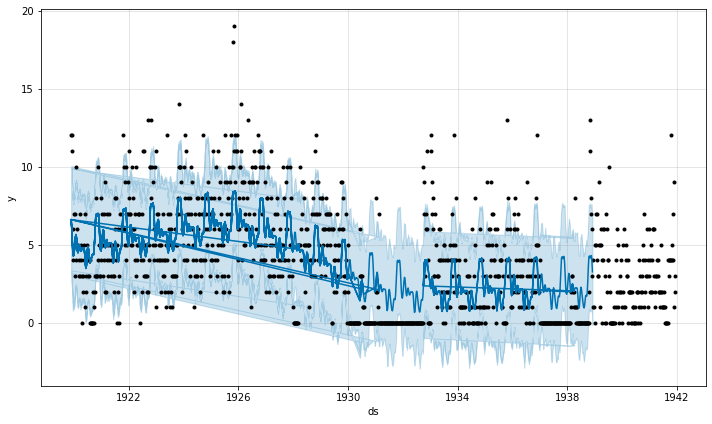

In [112]:
fig1 = newsub_m.plot(newsub_weekly_forecasts_df)

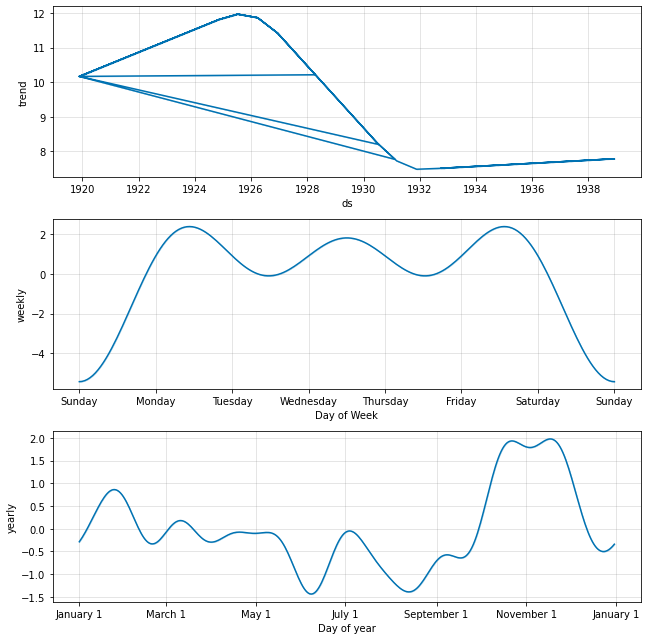

In [113]:
fig2 = newsub_m.plot_components(newsub_weekly_forecasts_df)

In [115]:
# plot new subscriptions logbooks with gaps
from altair import datum

newsubs_forecast_base = alt.Chart(newsub_weekly_forecasts).encode(
    alt.X('ds:T', axis=alt.Axis(title='date'))
).properties(
    width=1200,
    height=275
)

newsubs_forecast_line = newsubs_forecast_base.mark_line(color="orange").encode(
    alt.Y('yhat',
          axis=alt.Axis(title='new subscriptions per week'), scale=alt.Scale(domain=[0, 20])),
)
# .transform_filter(
    # alt.FieldLTPredicate(field='ds', lt=date(1919, 1,1))
# )

newsubs_area = newsubs_forecast_base.mark_area(opacity=0.3, color='orange').encode(
    alt.Y('yhat_upper',
          axis=alt.Axis(title=None), scale=alt.Scale(domain=[0, 20])),
    alt.Y2('yhat_lower')
)

# add newsubs last so it will be layered on top
newsubs_line + logbook_gaps_span + newsubs_area + newsubs_forecast_line

alt.LayerChart(...)

### forecast again, with growth and cap

the default forecast behavior is following a downward trend in the existing data leading into our later gaps, but based on the data afterwards that doesn't look right. 




In [116]:
# when is the largest week? 
growth_cap = newmember_subscriptions_by_week.total.max()
newmember_subscriptions_by_week[newmember_subscriptions_by_week.total == growth_cap]

,date,total,label
311,1925-11-08,19,documented


In [117]:
from datetime import date, timedelta
import math

from prophet import Prophet

post1932 = pd.to_datetime(date(1932, 9, 27))


def growth_forecast_missing_newsubs():
  # show some number of months before/after the gap and forecast
  oneweek = timedelta(days=7)
  sixweeks = timedelta(days=7*6)

  # lists to aggregate forecasts and models
  all_newsub_weekly_forecasts_dfs = []

  # there's a significant difference between 1920s and 1930s data,
  # and there's a big gap in 1931-1932
  # for gaps after 1936, only include counts after the 1932 gap
  #   February 16 1931 to September 26 1932 (588 days)
  #   December 31 1936 to February 17 1938 (413 days)

  post1932 = pd.to_datetime(date(1932, 9, 27))

  # use largest week across all data as our growth cap
  growth_cap = newmember_subscriptions_by_week.total.max()
  print('max from all data is %s' % growth_cap)


  for i, gap in enumerate(logbook_gaps):
    weekly_m = Prophet(growth='logistic', weekly_seasonality=True)  # use logistic growth instead of linear
    gap_start = gap['start']
    gap_end = gap['end']
    print('forecasting %s' % gap)

    preceding_data = newmember_subscriptions_by_week[newmember_subscriptions_by_week.date < gap_start]

    # for late gaps, only include counts after september 1932
    if gap_start.year >= 1936:
      preceding_data = preceding_data[preceding_data.date >= post1932 ]

    # drop any zeroes, so prophet doesn't fit to missing data
    preceding_data = preceding_data[preceding_data.total.gt(0)]

    # rename monthly count columns for prophet and fit the data
    data_to_fit = preceding_data.rename(columns={'date': 'ds', 'total': 'y'})
    data_to_fit['floor'] = 0
    # (should this be max from current data or next? or both? or all?)
    data_to_fit['cap'] = growth_cap
    weekly_m.fit(data_to_fit)

    # make a future dataframe to cover the gap 
    # (need at least 1 extra; may want to add more while testing)
    forecast_for = math.ceil(gap['days']/ 7) + 7
    print('gap is %s days, forecast for %d weeks' % (gap['days'], forecast_for))
    newsub_weeks_future = weekly_m.make_future_dataframe(periods=forecast_for, freq='W')

    # post_gap_data = newmember_subscriptions_by_week[newmember_subscriptions_by_week.date > gap_end][newmember_subscriptions_by_week.date < (gap_end + sixweeks)]
    newsub_weeks_future['floor'] = 0
    newsub_weeks_future['cap'] = growth_cap
    newsub_weeks_fcst = weekly_m.predict(newsub_weeks_future)

    # plot the forecast around our gap
    forecast_near_gap = newsub_weeks_fcst[(newsub_weeks_fcst.ds > (gap_start - oneweek)) & (newsub_weeks_fcst.ds < (gap_end + oneweek))]
    display(forecast_near_gap.head())
    # all_gap_forecasts_dfs.append(forecast_near_gap)

    newsub_weekly_count_near_gap = newmember_subscriptions_by_week[(newmember_subscriptions_by_week.date > (gap_start - oneweek)) & (newmember_subscriptions_by_week.date < (gap_end + oneweek))]

    forecast_near_gap = newsub_weeks_fcst[(newsub_weeks_fcst.ds > (gap_start - oneweek)) & (newsub_weeks_fcst.ds < (gap_end + oneweek))]

    all_newsub_weekly_forecasts_dfs.append(newsub_weeks_fcst.copy())

  # combine all the forecasts into a single df
  newsub_weekly_forecasts_dfs = pd.concat(all_newsub_weekly_forecasts_dfs)
  # all_gap_forecasts = pd.concat(all_gap_forecasts_dfs)

  return newsub_weekly_forecasts_dfs


newsub_weekly_growth_forecasts = growth_forecast_missing_newsubs()
newsub_weekly_growth_forecasts

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/mcgm8fs3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/073r2pzx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38136', 'data', 'file=/tmp/tmp1mhj93z6/mcgm8fs3.json', 'init=/tmp/tmp1mhj93z6/073r2pzx.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modeldqa5_4y3/prophet_model-20230113172210.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:22:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:22:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


max from all data is 19
forecasting {'start': Timestamp('1928-01-01 00:00:00'), 'end': Timestamp('1928-02-29 00:00:00'), 'days': 59}
gap is 59 days, forecast for 16 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
412,1928-01-01,0.002429,19,0,2.368118,9.288337,0.002429,0.002429,5.828334,5.828334,...,6.032624,6.032624,6.032624,-0.204290,-0.204290,-0.204290,0.0,0.0,0.0,5.830763
413,1928-01-08,0.002409,19,0,2.559365,9.477787,0.002409,0.002409,6.118169,6.118169,...,6.032624,6.032624,6.032624,0.085545,0.085545,0.085545,0.0,0.0,0.0,6.120578
414,1928-01-15,0.002390,19,0,3.273274,10.139356,0.002390,0.002390,6.604522,6.604522,...,6.032624,6.032624,6.032624,0.571898,0.571898,0.571898,0.0,0.0,0.0,6.606912
415,1928-01-22,0.002371,19,0,3.555427,10.600162,0.002371,0.002371,7.193083,7.193083,...,6.032624,6.032624,6.032624,1.160459,1.160459,1.160459,0.0,0.0,0.0,7.195454
416,1928-01-29,0.002353,19,0,3.891705,10.972458,0.002353,0.002353,7.412025,7.412025,...,6.032624,6.032624,6.032624,1.379401,1.379401,1.379401,0.0,0.0,0.0,7.414378


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/ys6yqm7_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/ckkw648b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96854', 'data', 'file=/tmp/tmp1mhj93z6/ys6yqm7_.json', 'init=/tmp/tmp1mhj93z6/ckkw648b.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modellpwdfey8/prophet_model-20230113172211.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:22:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:22:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1930-01-03 00:00:00'), 'end': Timestamp('1930-06-01 00:00:00'), 'days': 149}
gap is 149 days, forecast for 29 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
504,1929-12-29,9.813639,19,0,2.173264,9.105527,9.813639,9.813639,-4.101512,-4.101512,...,-3.608529,-3.608529,-3.608529,-0.492983,-0.492983,-0.492983,0.0,0.0,0.0,5.712127
505,1930-01-05,9.814545,19,0,2.610660,9.271271,9.814545,9.814545,-3.767892,-3.767892,...,-3.608529,-3.608529,-3.608529,-0.159363,-0.159363,-0.159363,0.0,0.0,0.0,6.046653
506,1930-01-12,9.815452,19,0,3.275770,10.248671,9.815452,9.815452,-3.174286,-3.174286,...,-3.608529,-3.608529,-3.608529,0.434244,0.434244,0.434244,0.0,0.0,0.0,6.641166
507,1930-01-19,9.816358,19,0,3.820803,10.853870,9.816358,9.816358,-2.494492,-2.494492,...,-3.608529,-3.608529,-3.608529,1.114037,1.114037,1.114037,0.0,0.0,0.0,7.321866
508,1930-01-26,9.817265,19,0,4.226025,10.850079,9.817265,9.817265,-2.157063,-2.157063,...,-3.608529,-3.608529,-3.608529,1.451466,1.451466,1.451466,0.0,0.0,0.0,7.660202


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/id3axewv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/qs6j7plg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61791', 'data', 'file=/tmp/tmp1mhj93z6/id3axewv.json', 'init=/tmp/tmp1mhj93z6/qs6j7plg.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modelursbxvuw/prophet_model-20230113172212.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:22:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:22:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1930-08-01 00:00:00'), 'end': Timestamp('1930-12-31 00:00:00'), 'days': 152}
gap is 152 days, forecast for 29 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
513,1930-07-27,0.007332,19,0,1.020403,8.449987,0.007332,0.007332,4.818899,4.818899,...,5.862767,5.862767,5.862767,-1.043868,-1.043868,-1.043868,0.0,0.0,0.0,4.826231
514,1930-08-03,0.007288,19,0,1.399156,8.200618,0.007288,0.007288,4.864601,4.864601,...,5.862767,5.862767,5.862767,-0.998166,-0.998166,-0.998166,0.0,0.0,0.0,4.871889
515,1930-08-10,0.007244,19,0,1.498795,8.313108,0.007244,0.007244,4.781354,4.781354,...,5.862767,5.862767,5.862767,-1.081413,-1.081413,-1.081413,0.0,0.0,0.0,4.788598
516,1930-08-17,0.007200,19,0,1.003167,8.097712,0.007200,0.007200,4.688433,4.688433,...,5.862767,5.862767,5.862767,-1.174334,-1.174334,-1.174334,0.0,0.0,0.0,4.695634
517,1930-08-24,0.007157,19,0,1.521728,8.228850,0.007157,0.007157,4.881375,4.881375,...,5.862767,5.862767,5.862767,-0.981392,-0.981392,-0.981392,0.0,0.0,0.0,4.888532


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/8iu9emzf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/05l3jedn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7548', 'data', 'file=/tmp/tmp1mhj93z6/8iu9emzf.json', 'init=/tmp/tmp1mhj93z6/05l3jedn.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modeldi6wts_1/prophet_model-20230113172214.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:22:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:22:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1931-02-17 00:00:00'), 'end': Timestamp('1932-09-25 00:00:00'), 'days': 586}
gap is 586 days, forecast for 91 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
518,1931-02-15,9.611355,19,0,2.064123,9.145655,9.611355,9.611355,-4.116441,-4.116441,...,-3.562307,-3.562307,-3.562307,-0.554134,-0.554134,-0.554134,0.0,0.0,0.0,5.494914
519,1931-02-22,9.611748,19,0,1.616607,8.922738,9.611748,9.611748,-4.324002,-4.324002,...,-3.562307,-3.562307,-3.562307,-0.761695,-0.761695,-0.761695,0.0,0.0,0.0,5.287746
520,1931-03-01,9.612141,19,0,2.105908,9.306312,9.612141,9.612141,-3.951861,-3.951861,...,-3.562307,-3.562307,-3.562307,-0.389554,-0.389554,-0.389554,0.0,0.0,0.0,5.660280
521,1931-03-08,9.612534,19,0,2.455875,9.509863,9.612534,9.612534,-3.579148,-3.579148,...,-3.562307,-3.562307,-3.562307,-0.016841,-0.016841,-0.016841,0.0,0.0,0.0,6.033386
522,1931-03-15,9.612927,19,0,2.497487,9.532085,9.612927,9.612927,-3.654016,-3.654016,...,-3.562307,-3.562307,-3.562307,-0.091709,-0.091709,-0.091709,0.0,0.0,0.0,5.958911


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/bojz_8_4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/z3wgxfo9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48830', 'data', 'file=/tmp/tmp1mhj93z6/bojz_8_4.json', 'init=/tmp/tmp1mhj93z6/z3wgxfo9.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_model9z1qxsss/prophet_model-20230113172215.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:22:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:22:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1937-01-01 00:00:00'), 'end': Timestamp('1938-02-16 00:00:00'), 'days': 411}
gap is 411 days, forecast for 66 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
186,1936-12-27,6.610260,19,0,-0.645018,5.228872,6.610260,6.610260,-4.296329,-4.296329,...,-3.577484,-3.577484,-3.577484,-0.718845,-0.718845,-0.718845,0.0,0.0,0.0,2.313930
187,1937-01-03,6.603339,19,0,0.106429,5.810774,6.603339,6.603339,-3.639169,-3.639169,...,-3.577484,-3.577484,-3.577484,-0.061685,-0.061685,-0.061685,0.0,0.0,0.0,2.964170
188,1937-01-10,6.596421,19,0,0.976353,6.832248,6.596421,6.596421,-2.773006,-2.773006,...,-3.577484,-3.577484,-3.577484,0.804478,0.804478,0.804478,0.0,0.0,0.0,3.823416
189,1937-01-17,6.589507,19,0,1.847058,7.707283,6.589507,6.589507,-1.879261,-1.879261,...,-3.577484,-3.577484,-3.577484,1.698222,1.698222,1.698222,0.0,0.0,0.0,4.710246
190,1937-01-24,6.582596,19,0,2.099535,8.058120,6.582595,6.582598,-1.419519,-1.419519,...,-3.577484,-3.577484,-3.577484,2.157965,2.157965,2.157965,0.0,0.0,0.0,5.163078


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/aq2c3h6n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/n6srtoyi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62893', 'data', 'file=/tmp/tmp1mhj93z6/aq2c3h6n.json', 'init=/tmp/tmp1mhj93z6/n6srtoyi.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_model99azhi3m/prophet_model-20230113172216.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:22:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:22:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1938-05-06 00:00:00'), 'end': Timestamp('1938-10-20 00:00:00'), 'days': 167}
gap is 167 days, forecast for 31 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
197,1938-05-01,0.111493,19,0,-0.221656,5.615401,0.111493,0.111493,2.617032,2.617032,...,2.971472,2.971472,2.971472,-0.354440,-0.354440,-0.354440,0.0,0.0,0.0,2.728524
198,1938-05-08,0.110362,19,0,0.132933,6.083711,0.110362,0.110362,2.931087,2.931087,...,2.971472,2.971472,2.971472,-0.040384,-0.040384,-0.040384,0.0,0.0,0.0,3.041449
199,1938-05-15,0.109242,19,0,0.117646,6.223806,0.109242,0.109242,3.111315,3.111315,...,2.971472,2.971472,2.971472,0.139844,0.139844,0.139844,0.0,0.0,0.0,3.220558
200,1938-05-22,0.108134,19,0,-0.194559,5.802480,0.108134,0.108134,2.857585,2.857585,...,2.971472,2.971472,2.971472,-0.113886,-0.113886,-0.113886,0.0,0.0,0.0,2.965720
201,1938-05-29,0.107037,19,0,-0.613408,5.186917,0.107037,0.107037,2.198144,2.198144,...,2.971472,2.971472,2.971472,-0.773328,-0.773328,-0.773328,0.0,0.0,0.0,2.305181


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1919-11-23,0.069341,19,0,4.978245,11.651992,0.069341,0.069341,8.317353,8.317353,...,6.032624,6.032624,6.032624,2.284729,2.284729,2.284729,0.0,0.0,0.0,8.386693
1,1919-11-30,0.068795,19,0,4.137337,11.263769,0.068795,0.068795,7.593569,7.593569,...,6.032624,6.032624,6.032624,1.560945,1.560945,1.560945,0.0,0.0,0.0,7.662364
2,1919-12-07,0.068253,19,0,2.961598,9.918799,0.068253,0.068253,6.497956,6.497956,...,6.032624,6.032624,6.032624,0.465332,0.465332,0.465332,0.0,0.0,0.0,6.566209
3,1919-12-14,0.067716,19,0,2.259154,9.209582,0.067716,0.067716,5.719724,5.719724,...,6.032624,6.032624,6.032624,-0.312900,-0.312900,-0.312900,0.0,0.0,0.0,5.787440
4,1919-12-21,0.067183,19,0,2.110963,8.958679,0.067183,0.067183,5.533316,5.533316,...,6.032624,6.032624,6.032624,-0.499309,-0.499309,-0.499309,0.0,0.0,0.0,5.600498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
224,1938-11-06,0.084647,19,0,1.605591,7.303692,0.084646,0.084647,4.493842,4.493842,...,2.971472,2.971472,2.971472,1.522371,1.522371,1.522371,0.0,0.0,0.0,4.578489
225,1938-11-13,0.083787,19,0,2.449945,8.336855,0.083787,0.083788,5.422598,5.422598,...,2.971472,2.971472,2.971472,2.451127,2.451127,2.451127,0.0,0.0,0.0,5.506385
226,1938-11-20,0.082936,19,0,2.553156,8.453674,0.082935,0.082936,5.441370,5.441370,...,2.971472,2.971472,2.971472,2.469898,2.469898,2.469898,0.0,0.0,0.0,5.524306
227,1938-11-27,0.082093,19,0,1.456444,7.247429,0.082093,0.082094,4.378995,4.378995,...,2.971472,2.971472,2.971472,1.407523,1.407523,1.407523,0.0,0.0,0.0,4.461088


#### plot the forecasts

In [123]:
plot_newsubs_weekly_forecast(newsub_weekly_growth_forecasts)

<ipython-input-120-8f0cb2a82ba7>:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

In [124]:
plot_newsubs_weekly_forecast(newsub_weekly_growth_forecasts, show_model=True)

<ipython-input-120-8f0cb2a82ba7>:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

### fit on all weeks, logistic growth

In [125]:
lognewsub_m = Prophet(weekly_seasonality=True, growth='logistic')
# use largest week across all data as our growth cap
growth_cap = newmember_subscriptions_by_week.total.max()

newmember_weekly_subs = newmember_subscriptions_by_week.rename(columns={'date': 'ds', 'total': 'y'})
newmember_weekly_subs['floor'] = 0
newmember_weekly_subs['cap'] = growth_cap
# rename monthly count columns for prophet and fit the data
lognewsub_m.fit(newmember_weekly_subs)

# lognewsub_weeks_fcst

post1932 = pd.to_datetime(date(1932, 9, 27))

# show some number of months before/after the gap and forecast
oneweek = timedelta(days=7)

# lists to aggregate forecasts and models
all_lognewsub_forecasts_dfs = []

# there's a significant difference between 1920s and 1930s data,
# and there's a big gap in 1931-1932
# for gaps after 1936, only include counts after the 1932 gap
#   February 16 1931 to September 26 1932 (588 days)
#   December 31 1936 to February 17 1938 (413 days)

post1932 = pd.to_datetime(date(1932, 9, 27))

for i, gap in enumerate(logbook_gaps):
  gap_start = gap['start']
  gap_end = gap['end']
  print('forecasting %s' % gap)

  weekly_m = Prophet()
  gap_start = gap['start']
  gap_end = gap['end']
  print('forecasting %s' % gap)

  # preceding_data = logbooks_weekly_count[logbooks_weekly_count.logbook_date < gap_start]
  preceding_data = newmember_subscriptions_by_week[newmember_subscriptions_by_week.date < gap_start]

  # for late gaps, only include counts after september 1932
  if gap_start.year >= 1936:
    preceding_data = preceding_data[preceding_data.date >= post1932 ]

  # drop any zeroes, so prophet doesn't fit to missing data
  # FIXME: needed/wanted?
  preceding_data = preceding_data[preceding_data.total.gt(0)]

  preceding_data['floor'] = 0
  preceding_data['cap'] = growth_cap

  # rename monthly count columns for prophet and fit the data
  weekly_m.fit(preceding_data.rename(columns={'date': 'ds', 'total': 'y'}))

  # make a future dataframe to cover the gap 
  # (need at least 1 extra; may want to add more while testing)
  forecast_for = math.ceil(gap['days']/ 7) + 7
  # forecast_for = float(gap['days'])/7.0 + 7
  print('gap is %s days, forecast for %d weeks' % (gap['days'], forecast_for))

  # use mini prophet to make the future relative to our gap
  newsub_weeks_future = weekly_m.make_future_dataframe(periods=forecast_for, freq='W')

  # newsub_weeks_future = newsub_m.make_future_dataframe(periods=forecast_for, freq='W')
  newsub_weeks_future['floor'] = 0
  newsub_weeks_future['cap'] = growth_cap
  newsub_weeks_fcst = lognewsub_m.predict(newsub_weeks_future)

  # plot the forecast around our gap
  forecast_near_gap = newsub_weeks_fcst[(newsub_weeks_fcst.ds > (gap_start - oneweek)) & (newsub_weeks_fcst.ds < (gap_end + oneweek))]
  display(forecast_near_gap.head())
  # all_gap_forecasts_dfs.append(forecast_near_gap)

  newsub_weekly_count_near_gap = newmember_subscriptions_by_week[(newmember_subscriptions_by_week.date > (gap_start - oneweek)) & (newmember_subscriptions_by_week.date < (gap_end + oneweek))]

  forecast_near_gap = newsub_weeks_fcst[(newsub_weeks_fcst.ds > (gap_start - oneweek)) & (newsub_weeks_fcst.ds < (gap_end + oneweek))]

  all_lognewsub_forecasts_dfs.append(newsub_weeks_fcst.copy())


all_lognewsub_forecasts_dfs  


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/r713me7b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/4qa6f5j0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6483', 'data', 'file=/tmp/tmp1mhj93z6/r713me7b.json', 'init=/tmp/tmp1mhj93z6/4qa6f5j0.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modelikw_iz4e/prophet_model-20230113172621.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:26:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. 

forecasting {'start': Timestamp('1928-01-01 00:00:00'), 'end': Timestamp('1928-02-29 00:00:00'), 'days': 59}
forecasting {'start': Timestamp('1928-01-01 00:00:00'), 'end': Timestamp('1928-02-29 00:00:00'), 'days': 59}


17:26:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 59 days, forecast for 16 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
412,1928-01-01,2.769580,19,0,0.089374,7.305351,2.769580,2.769580,0.926306,0.926306,...,1.298633,1.298633,1.298633,-0.372327,-0.372327,-0.372327,0.0,0.0,0.0,3.695886
413,1928-01-08,2.764489,19,0,0.510954,7.806750,2.764489,2.764489,1.299888,1.299888,...,1.298633,1.298633,1.298633,0.001255,0.001255,0.001255,0.0,0.0,0.0,4.064377
414,1928-01-15,2.759406,19,0,0.952877,8.505613,2.759406,2.759406,1.745783,1.745783,...,1.298633,1.298633,1.298633,0.447150,0.447150,0.447150,0.0,0.0,0.0,4.505189
415,1928-01-22,2.754330,19,0,1.003324,8.452953,2.754330,2.754330,2.072603,2.072603,...,1.298633,1.298633,1.298633,0.773970,0.773970,0.773970,0.0,0.0,0.0,4.826933
416,1928-01-29,2.749262,19,0,1.128686,8.158018,2.749262,2.749262,2.071807,2.071807,...,1.298633,1.298633,1.298633,0.773174,0.773174,0.773174,0.0,0.0,0.0,4.821069


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/ytkxjrmo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/_gd_ie8f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58988', 'data', 'file=/tmp/tmp1mhj93z6/ytkxjrmo.json', 'init=/tmp/tmp1mhj93z6/_gd_ie8f.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modelvcfruwu3/prophet_model-20230113172622.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:26:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1930-01-03 00:00:00'), 'end': Timestamp('1930-06-01 00:00:00'), 'days': 149}
forecasting {'start': Timestamp('1930-01-03 00:00:00'), 'end': Timestamp('1930-06-01 00:00:00'), 'days': 149}


17:26:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 149 days, forecast for 29 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
504,1929-12-29,2.280537,19,0,-0.456979,6.673316,2.280537,2.280537,0.835544,0.835544,...,1.298633,1.298633,1.298633,-0.463089,-0.463089,-0.463089,0.0,0.0,0.0,3.116081
505,1930-01-05,2.276219,19,0,-0.331864,7.492050,2.276219,2.276219,1.150643,1.150643,...,1.298633,1.298633,1.298633,-0.147990,-0.147990,-0.147990,0.0,0.0,0.0,3.426861
506,1930-01-12,2.271907,19,0,0.109188,7.489545,2.271907,2.271907,1.588627,1.588627,...,1.298633,1.298633,1.298633,0.289994,0.289994,0.289994,0.0,0.0,0.0,3.860534
507,1930-01-19,2.267603,19,0,0.514549,7.700175,2.267603,2.267603,1.984075,1.984075,...,1.298633,1.298633,1.298633,0.685442,0.685442,0.685442,0.0,0.0,0.0,4.251678
508,1930-01-26,2.263306,19,0,0.770937,8.374946,2.263306,2.263306,2.118095,2.118095,...,1.298633,1.298633,1.298633,0.819462,0.819462,0.819462,0.0,0.0,0.0,4.381401


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/ok48oej7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/m_7ihqch.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59423', 'data', 'file=/tmp/tmp1mhj93z6/ok48oej7.json', 'init=/tmp/tmp1mhj93z6/m_7ihqch.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modelswbdtony/prophet_model-20230113172624.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:26:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1930-08-01 00:00:00'), 'end': Timestamp('1930-12-31 00:00:00'), 'days': 152}
forecasting {'start': Timestamp('1930-08-01 00:00:00'), 'end': Timestamp('1930-12-31 00:00:00'), 'days': 152}
gap is 152 days, forecast for 29 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
513,1930-07-27,2.154032,19,0,-0.968538,6.291280,2.154032,2.154032,0.403414,0.403414,...,1.298633,1.298633,1.298633,-0.895219,-0.895219,-0.895219,0.0,0.0,0.0,2.557446
514,1930-08-03,2.149923,19,0,-1.408782,5.929947,2.149923,2.149923,0.144890,0.144890,...,1.298633,1.298633,1.298633,-1.153743,-1.153743,-1.153743,0.0,0.0,0.0,2.294813
515,1930-08-10,2.145820,19,0,-1.914601,5.550241,2.145820,2.145820,-0.038343,-0.038343,...,1.298633,1.298633,1.298633,-1.336976,-1.336976,-1.336976,0.0,0.0,0.0,2.107477
516,1930-08-17,2.141724,19,0,-1.782718,5.900946,2.141724,2.141724,-0.027701,-0.027701,...,1.298633,1.298633,1.298633,-1.326334,-1.326334,-1.326334,0.0,0.0,0.0,2.114024
517,1930-08-24,2.137635,19,0,-1.264721,6.022326,2.137635,2.137635,0.229136,0.229136,...,1.298633,1.298633,1.298633,-1.069497,-1.069497,-1.069497,0.0,0.0,0.0,2.366771


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/tr0sb12t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/y990021c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92907', 'data', 'file=/tmp/tmp1mhj93z6/tr0sb12t.json', 'init=/tmp/tmp1mhj93z6/y990021c.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_model1yu7ibqp/prophet_model-20230113172625.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:26:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1931-02-17 00:00:00'), 'end': Timestamp('1932-09-25 00:00:00'), 'days': 586}
forecasting {'start': Timestamp('1931-02-17 00:00:00'), 'end': Timestamp('1932-09-25 00:00:00'), 'days': 586}


17:26:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 586 days, forecast for 91 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
518,1931-02-15,2.037606,19,0,-0.636398,6.760569,2.037606,2.037606,1.035996,1.035996,...,1.298633,1.298633,1.298633,-0.262637,-0.262637,-0.262637,0.0,0.0,0.0,3.073602
519,1931-02-22,2.033692,19,0,-0.924195,6.505150,2.033692,2.033692,0.945193,0.945193,...,1.298633,1.298633,1.298633,-0.353439,-0.353439,-0.353439,0.0,0.0,0.0,2.978885
520,1931-03-01,2.029784,19,0,-0.633949,7.041645,2.029784,2.029784,1.173901,1.173901,...,1.298633,1.298633,1.298633,-0.124732,-0.124732,-0.124732,0.0,0.0,0.0,3.203685
521,1931-03-08,2.025883,19,0,-0.262937,6.964992,2.025883,2.025883,1.418110,1.418110,...,1.298633,1.298633,1.298633,0.119477,0.119477,0.119477,0.0,0.0,0.0,3.443993
522,1931-03-15,2.021989,19,0,-0.146452,7.342280,2.021989,2.021989,1.413396,1.413396,...,1.298633,1.298633,1.298633,0.114763,0.114763,0.114763,0.0,0.0,0.0,3.435385


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/42vff3r2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/l08yu9u7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38319', 'data', 'file=/tmp/tmp1mhj93z6/42vff3r2.json', 'init=/tmp/tmp1mhj93z6/l08yu9u7.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modelnejxlev0/prophet_model-20230113172626.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:26:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1937-01-01 00:00:00'), 'end': Timestamp('1938-02-16 00:00:00'), 'days': 411}
forecasting {'start': Timestamp('1937-01-01 00:00:00'), 'end': Timestamp('1938-02-16 00:00:00'), 'days': 411}
gap is 411 days, forecast for 66 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
186,1936-12-27,1.111743,19,0,-1.968928,5.753387,1.111743,1.111743,0.789952,0.789952,...,1.298633,1.298633,1.298633,-0.508681,-0.508681,-0.508681,0.0,0.0,0.0,1.901695
187,1937-01-03,1.109491,19,0,-1.499242,5.809928,1.109491,1.109491,1.055452,1.055452,...,1.298633,1.298633,1.298633,-0.243180,-0.243180,-0.243180,0.0,0.0,0.0,2.164943
188,1937-01-10,1.107243,19,0,-1.196871,6.592407,1.107243,1.107243,1.475285,1.475285,...,1.298633,1.298633,1.298633,0.176652,0.176652,0.176652,0.0,0.0,0.0,2.582528
189,1937-01-17,1.105000,19,0,-0.768212,6.740472,1.105000,1.105000,1.901148,1.901148,...,1.298633,1.298633,1.298633,0.602515,0.602515,0.602515,0.0,0.0,0.0,3.006148
190,1937-01-24,1.102761,19,0,-0.477368,7.069685,1.102761,1.102761,2.119539,2.119539,...,1.298633,1.298633,1.298633,0.820906,0.820906,0.820906,0.0,0.0,0.0,3.222300


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/jnwka8e4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/k14483da.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5563', 'data', 'file=/tmp/tmp1mhj93z6/jnwka8e4.json', 'init=/tmp/tmp1mhj93z6/k14483da.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modelxu7e44q5/prophet_model-20230113172627.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:26:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1938-05-06 00:00:00'), 'end': Timestamp('1938-10-20 00:00:00'), 'days': 167}
forecasting {'start': Timestamp('1938-05-06 00:00:00'), 'end': Timestamp('1938-10-20 00:00:00'), 'days': 167}
gap is 167 days, forecast for 31 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
197,1938-05-01,0.964063,19,0,-1.634517,5.810784,0.964063,0.964063,1.189676,1.189676,...,1.298633,1.298633,1.298633,-0.108957,-0.108957,-0.108957,0.0,0.0,0.0,2.153739
198,1938-05-08,0.962094,19,0,-1.632742,5.962609,0.962094,0.962094,1.213450,1.213450,...,1.298633,1.298633,1.298633,-0.085183,-0.085183,-0.085183,0.0,0.0,0.0,2.175543
199,1938-05-15,0.960129,19,0,-1.496641,5.748890,0.960129,0.960129,1.154230,1.154230,...,1.298633,1.298633,1.298633,-0.144403,-0.144403,-0.144403,0.0,0.0,0.0,2.114359
200,1938-05-22,0.958167,19,0,-1.911130,5.460856,0.958167,0.958167,0.839934,0.839934,...,1.298633,1.298633,1.298633,-0.458698,-0.458698,-0.458698,0.0,0.0,0.0,1.798102
201,1938-05-29,0.956210,19,0,-2.429772,5.135532,0.956210,0.956210,0.317424,0.317424,...,1.298633,1.298633,1.298633,-0.981209,-0.981209,-0.981209,0.0,0.0,0.0,1.273634


[            ds     trend  cap  floor  yhat_lower  yhat_upper  trend_lower  \
 0   1919-11-23  5.662168   19      0    5.246011   12.508965     5.662168   
 1   1919-11-30  5.653565   19      0    4.612034   12.077275     5.653565   
 2   1919-12-07  5.644970   19      0    3.872995   11.141117     5.644970   
 3   1919-12-14  5.636382   19      0    2.854447   10.675733     5.636382   
 4   1919-12-21  5.627802   19      0    2.551395   10.055619     5.627802   
 ..         ...       ...  ...    ...         ...         ...          ...   
 423 1928-03-18  2.714004   19      0    0.502641    7.669110     2.714004   
 424 1928-03-25  2.708997   19      0   -0.017747    7.667981     2.708997   
 425 1928-04-01  2.703999   19      0   -0.280378    7.275077     2.703999   
 426 1928-04-08  2.699008   19      0    0.158196    7.680034     2.699008   
 427 1928-04-15  2.694025   19      0   -0.116564    7.655219     2.694025   
 
      trend_upper  additive_terms  additive_terms_lower  ...  

In [126]:
lognewsub_weeks_fcst = pd.concat(all_lognewsub_forecasts_dfs)

In [127]:
plot_newsubs_weekly_forecast(lognewsub_weeks_fcst, show_model=True)

<ipython-input-120-8f0cb2a82ba7>:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

### aggregate forecast values

In [128]:
%%capture
!pip install DateTimeRange

In [129]:
from datetimerange import DateTimeRange


onemonth = timedelta(days=31)
fivedays = timedelta(days=5)
oneday = timedelta(days=5)
oneweek = timedelta(days=7)

# newsub_member_total = len(subscription_first_events.member_id.unique())
# member_total = len(events_df.member_id.unique())

# allow overrides for aggregrating uniq name estimates
def aggregrate_missing_newsub_estimates(forecast_df, newmember_subscriptions_by_week=newmember_subscriptions_by_week, newsub_member_total=None, member_total=None):

  newsub_weekly_missing = 0
  newsub_weekly_missing_upper = 0
  newsub_weekly_missing_lower = 0

  if newsub_member_total is None:
    newsub_member_total = len(subscription_first_events.member_id.unique())
  if member_total is None:
    member_total = len(events_df.member_id.unique())


  newsub_weekly_estimates = []

  for i, gap in enumerate(logbook_gaps): 
    gap_start = gap['start']
    gap_end = gap['end']
    # print(gap_start, gap_end)
    # print('gap range ')
    gap_range = DateTimeRange(gap_start, gap_end)
    # print(gap_range)

    # get documented counts for this time period
    gap_counts = newmember_subscriptions_by_week[(newmember_subscriptions_by_week.date >= gap_start) & (newmember_subscriptions_by_week.date <= gap_end + oneweek)]
    # now get the forecast for the same weeks
    
    # weekly_forecast = newsub_weekly_forecasts_df[(newsub_weekly_forecasts_df.ds >= gap_start) & (newsub_weekly_forecasts_df.ds <= gap_end + oneweek)]

    weekly_forecast = forecast_df[(forecast_df.ds >= gap_start) & (forecast_df.ds <= gap_end + oneweek)]
    # print(weekly_forecast[['ds', 'yhat', 'yhat_upper', 'yhat_lower']].head())

    for week in gap_counts.itertuples():
      week_start = week.date 

      # do logbook weeks and forecast weeks match?
      # missing estimate is the forecast value minus any actual recorded count for this day
      documented_week = newmember_subscriptions_by_week[newmember_subscriptions_by_week.date == week.date]  #.iloc[0]
      # seems possible there's no documented week
      if documented_week.shape[0]:
        documented_week = documented_week.iloc[0]
      else: 
        documented_week = None

      # check if the padding put us past the end of the current gap
      if week_start > gap_end:
        continue

      # get the end of the same month (first of the next month minus one day)
      week_end = week_start + oneweek
      # how many days from this month overlap with our gap?
      gap_intersection = gap_range.intersection(DateTimeRange(week_start, week_end))
      overlap_days = gap_intersection.timedelta.days
      if overlap_days != 7:
        print('gap overlap for %s is %d days' % (week_end, overlap_days))
      # what is our threshold for using the forecast value instead of recorded? 
      # let's try 3 days
      if overlap_days > 3:
        week_total = 0
        if not documented_week.empty:
          week_total = week.total

        # get the forecast value for this week
        week_forecast = weekly_forecast[(weekly_forecast.ds >= week_start) & (weekly_forecast.ds <= week_end)].iloc[0]
        # missing estimate is the forecast value minus any actual recorded count for this month
        newsub_weekly_missing += max(0, (max(0, week_forecast.yhat) - week_total))
        newsub_weekly_missing_upper += (week_forecast.yhat_upper - week_total)
        # cap lower estimate at zero
        newsub_weekly_missing_lower += max(0, (max(0, week_forecast.yhat_lower) - week_total))

        # aggregate forecast values so we can output as csv for reference
        newsub_weekly_estimates.append({
            'date': week.date,
            'documented_total': week_total,
            'gap_days': overlap_days,
            'forecast': week_forecast.yhat,
            'forecast_upper': week_forecast.yhat_upper,
            'forecast_lower': week_forecast.yhat_lower,
            'forecast_range': week_forecast.yhat_upper - week_forecast.yhat_lower,
        })

        newsub_estimates_df = pd.DataFrame(newsub_weekly_estimates)
        newsub_estimates_df.to_csv('newsub_weekly_forecast.csv', index=False)

  print('''\n\nmissing estimates:
    %s
    upper: %s
    lower: %s''' % (newsub_weekly_missing, newsub_weekly_missing_upper, newsub_weekly_missing_lower))
  
  estimated_total = newsub_member_total + newsub_weekly_missing
  estimated_total_upper = newsub_member_total + newsub_weekly_missing_upper
  estimated_total_lower = newsub_member_total + newsub_weekly_missing_lower

  est_percent = (member_total / estimated_total ) * 100
  est_percent_upper = (member_total / estimated_total_upper ) * 100
  est_percent_lower = (member_total / estimated_total_lower ) * 100

  # summarize the result
  print('''
  total unique members: %d
  total members from first subscriptions: %d
  estimated missing subscriptions: %.2f (upper %.2f, lower %.2f)
  estimated total subscriptions from logbooks: %.2f (upper %.2f, lower %.2f)
  total missing: %d (upper %d, lower %d)
  estimated percent: %.2f (upper %.2f, lower %.2f)
  ''' % (member_total, newsub_member_total, 
         # estimated missing
          newsub_weekly_missing, newsub_weekly_missing_upper, newsub_weekly_missing_lower,
         # estimated total
          estimated_total, estimated_total_upper, estimated_total_lower, 
         # total missing
          max(0, estimated_total - member_total),
            estimated_total_upper - member_total,
          max(0, estimated_total_lower - member_total),
          est_percent, est_percent_upper, est_percent_lower
          ))
  
  # return (newsub_weekly_missing, newsub_weekly_missing_upper, newsub_weekly_missing_lower)
  
# newsub_missing, newsub_missing_upper, newsub_missing_lower = aggregrate_missing_newsub_estimates()

### summarize

In [130]:
# initial forecast, calculated the same way as membership activity
aggregrate_missing_newsub_estimates(newsub_weekly_forecasts)

gap overlap for 1928-03-04 00:00:00 is 3 days
gap overlap for 1930-06-08 00:00:00 is 0 days
gap overlap for 1931-01-04 00:00:00 is 3 days
gap overlap for 1932-10-02 00:00:00 is 0 days
gap overlap for 1938-02-20 00:00:00 is 3 days
gap overlap for 1938-10-23 00:00:00 is 4 days


missing estimates:
    458.1301470890682
    upper: 1134.6687585990046
    lower: 93.1204905972484

  total unique members: 5139
  total members from first subscriptions: 4320
  estimated missing subscriptions: 458.13 (upper 1134.67, lower 93.12)
  estimated total subscriptions from logbooks: 4778.13 (upper 5454.67, lower 4413.12)
  total missing: 0 (upper 315, lower 0)
  estimated percent: 107.55 (upper 94.21, lower 116.45)
  


In [131]:
# second forecast, fitting prophet on all data 
# - this result seems better than the first linear model
aggregrate_missing_newsub_estimates(newsub_weekly_forecasts_df)


gap overlap for 1928-03-04 00:00:00 is 3 days
gap overlap for 1930-06-08 00:00:00 is 0 days
gap overlap for 1931-01-04 00:00:00 is 3 days
gap overlap for 1932-10-02 00:00:00 is 0 days
gap overlap for 1938-02-20 00:00:00 is 3 days
gap overlap for 1938-10-23 00:00:00 is 4 days


missing estimates:
    497.6432206791749
    upper: 1222.2412955520426
    lower: 30.409885571171483

  total unique members: 5139
  total members from first subscriptions: 4320
  estimated missing subscriptions: 497.64 (upper 1222.24, lower 30.41)
  estimated total subscriptions from logbooks: 4817.64 (upper 5542.24, lower 4350.41)
  total missing: 0 (upper 403, lower 0)
  estimated percent: 106.67 (upper 92.72, lower 118.13)
  


In [132]:
# third forecast, with logistic growth and cap
aggregrate_missing_newsub_estimates(newsub_weekly_growth_forecasts)

gap overlap for 1928-03-04 00:00:00 is 3 days
gap overlap for 1930-06-08 00:00:00 is 0 days
gap overlap for 1931-01-04 00:00:00 is 3 days
gap overlap for 1932-10-02 00:00:00 is 0 days
gap overlap for 1938-02-20 00:00:00 is 3 days
gap overlap for 1938-10-23 00:00:00 is 4 days


missing estimates:
    1026.5126160682544
    upper: 1725.0101234296446
    lower: 368.1549436239217

  total unique members: 5139
  total members from first subscriptions: 4320
  estimated missing subscriptions: 1026.51 (upper 1725.01, lower 368.15)
  estimated total subscriptions from logbooks: 5346.51 (upper 6045.01, lower 4688.15)
  total missing: 207 (upper 906, lower 0)
  estimated percent: 96.12 (upper 85.01, lower 109.62)
  


## new members by first subscription, aggregated by unique name

In [133]:
member_events.head()

,event_type,member_id,date,source_type
671,Subscription,cahun,1919-11-17,Lending Library Card;Logbook
29914,Subscription,worthing,1919-11-17,Logbook
29915,Subscription,flot-marcelle,1919-11-17,Logbook
672,Subscription,regnier,1919-11-18,Logbook;Lending Library Card
676,Subscription,ulmann,1919-11-18,Logbook;Lending Library Card


In [134]:
# member events doesn't include names, so join to get it back in

events_df[['member_id', 'member_names', 'member_sort_names']]

,member_id,member_names,member_sort_names
0,linossier-raymonde,Raymonde Linossier,"Linossier, Raymonde"
1,garreta,Mme Garreta,"Garreta, Mme"
2,rhys,Mr. Rhys,"Rhys, Mr."
3,walsh,Ernest Walsh,"Walsh, Ernest"
4,lincoln-1,Mr. Lincoln,"Lincoln, Mr."
...,...,...,...
35518,gutmann-henri,Henri Gutmann,"Gutmann, Henri"
35519,bernheim-antoinette,Antoinette Bernheim,"Bernheim, Antoinette"
35520,baldwin-mr,Mr. Baldwin,"Baldwin, Mr."
35521,bernheim-antoinette,Antoinette Bernheim,"Bernheim, Antoinette"


In [135]:
member_uniqname_events = pd.merge(member_events, events_df[['member_id', 'member_names']], on='member_id')

In [136]:
member_uniqname_events

,event_type,member_id,date,source_type,member_names
0,Subscription,cahun,1919-11-17,Lending Library Card;Logbook,Claude Cahun / Mlle Lucie Schwob
1,Subscription,cahun,1919-11-17,Lending Library Card;Logbook,Claude Cahun / Mlle Lucie Schwob
2,Subscription,cahun,1919-11-17,Lending Library Card;Logbook,Claude Cahun / Mlle Lucie Schwob
3,Subscription,cahun,1919-11-17,Lending Library Card;Logbook,Claude Cahun / Mlle Lucie Schwob
4,Borrow,cahun,1919-11-19,Lending Library Card,Claude Cahun / Mlle Lucie Schwob
...,...,...,...,...,...
6784391,Subscription,azgema,1941-12-06,Logbook,Azgema
6784392,Subscription,godard,1941-12-09,Logbook,Godard
6784393,Subscription,godard,1941-12-09,Logbook,Godard
6784394,Renewal,kohlberg-8,1941-12-09,Logbook,Kohlberg


In [137]:
# go back to member events, limit to logbooks AND by event type, then group and get first event for each member
subscription_uniqname_first_events = member_uniqname_events[member_uniqname_events.source_type.str.contains('Logbook') & member_uniqname_events.event_type.isin(['Subscription', 'Renewal'])].groupby("member_names").first().reset_index()
subscription_uniqname_first_events

,member_names,event_type,member_id,date,source_type
0,"""Friend of Mlle Pottecher""",Subscription,pottecher-friend-of,1922-04-08,Logbook
1,"""Friend of Renoir""",Subscription,friend-of-renoir,1920-12-06,Logbook
2,A. Bigorie,Subscription,bigorie,1929-10-11,Logbook
3,A. Clarke,Subscription,clarke-a,1925-10-21,Logbook;Address Book
4,A. Derevianko,Subscription,derevianko,1933-07-04,Logbook;Address Book
...,...,...,...,...,...
3970,van Altena,Subscription,van-altena,1934-05-12,Logbook
3971,van Leeuhof,Renewal,van-leeuhof,1928-05-18,Logbook
3972,van Zyl,Subscription,van-zyl,1935-10-25,Logbook
3973,Édouard Roditi,Subscription,roditi-edouard,1928-05-18,Logbook;Lending Library Card


In [138]:
# get new member monthly count based only on subscriptions, so we can forecast with prophet
newmember_uniqname_subscriptions_by_week = subscription_uniqname_first_events.groupby([pd.Grouper(key='date', freq='W')])['member_names'].count().reset_index()
newmember_uniqname_subscriptions_by_week.rename(columns={'member_names': 'total'}, inplace=True)
newmember_uniqname_subscriptions_by_week

,date,total
0,1919-11-23,12
1,1919-11-30,11
2,1919-12-07,12
3,1919-12-14,6
4,1919-12-21,4
...,...,...
1147,1941-11-16,4
1148,1941-11-23,1
1149,1941-11-30,9
1150,1941-12-07,3


### prophet on new subscriptions by uniq name

In [139]:
from datetime import date, timedelta
import math

from prophet import Prophet

post1932 = pd.to_datetime(date(1932, 9, 27))


def growth_forecast_missing_uniqname_newsubs():
  # show some number of months before/after the gap and forecast
  oneweek = timedelta(days=7)
  sixweeks = timedelta(days=7*6)

  # lists to aggregate forecasts and models
  all_newsub_weekly_forecasts_dfs = []

  # there's a significant difference between 1920s and 1930s data,
  # and there's a big gap in 1931-1932
  # for gaps after 1936, only include counts after the 1932 gap
  #   February 16 1931 to September 26 1932 (588 days)
  #   December 31 1936 to February 17 1938 (413 days)

  post1932 = pd.to_datetime(date(1932, 9, 27))

  # use largest week across all data as our growth cap
  growth_cap = newmember_uniqname_subscriptions_by_week.total.max()
  print('max from all data is %s' % growth_cap)


  for i, gap in enumerate(logbook_gaps):
    weekly_m = Prophet(growth='logistic', weekly_seasonality=True)  # use logistic growth instead of linear
    gap_start = gap['start']
    gap_end = gap['end']
    print('forecasting %s' % gap)

    preceding_data = newmember_uniqname_subscriptions_by_week[newmember_uniqname_subscriptions_by_week.date < gap_start]

    # for late gaps, only include counts after september 1932
    if gap_start.year >= 1936:
      preceding_data = preceding_data[preceding_data.date >= post1932 ]

    # drop any zeroes, so prophet doesn't fit to missing data
    preceding_data = preceding_data[preceding_data.total.gt(0)]

    # rename monthly count columns for prophet and fit the data
    data_to_fit = preceding_data.rename(columns={'date': 'ds', 'total': 'y'})
    data_to_fit['floor'] = 0
    # (should this be max from current data or next? or both? or all?)
    data_to_fit['cap'] = growth_cap
    weekly_m.fit(data_to_fit)

    # make a future dataframe to cover the gap 
    # (need at least 1 extra; may want to add more while testing)
    forecast_for = math.ceil(gap['days']/ 7) + 7
    print('gap is %s days, forecast for %d weeks' % (gap['days'], forecast_for))
    newsub_weeks_future = weekly_m.make_future_dataframe(periods=forecast_for, freq='W')

    # post_gap_data = newmember_subscriptions_by_week[newmember_subscriptions_by_week.date > gap_end][newmember_subscriptions_by_week.date < (gap_end + sixweeks)]
    newsub_weeks_future['floor'] = 0
    newsub_weeks_future['cap'] = growth_cap
    newsub_weeks_fcst = weekly_m.predict(newsub_weeks_future)

    # plot the forecast around our gap
    forecast_near_gap = newsub_weeks_fcst[(newsub_weeks_fcst.ds > (gap_start - oneweek)) & (newsub_weeks_fcst.ds < (gap_end + oneweek))]
    display(forecast_near_gap.head())
    # all_gap_forecasts_dfs.append(forecast_near_gap)

    newsub_weekly_count_near_gap = newmember_subscriptions_by_week[(newmember_subscriptions_by_week.date > (gap_start - oneweek)) & (newmember_subscriptions_by_week.date < (gap_end + oneweek))]

    forecast_near_gap = newsub_weeks_fcst[(newsub_weeks_fcst.ds > (gap_start - oneweek)) & (newsub_weeks_fcst.ds < (gap_end + oneweek))]

    all_newsub_weekly_forecasts_dfs.append(newsub_weeks_fcst.copy())

  # combine all the forecasts into a single df
  newsub_weekly_forecasts_dfs = pd.concat(all_newsub_weekly_forecasts_dfs)
  # all_gap_forecasts = pd.concat(all_gap_forecasts_dfs)

  return newsub_weekly_forecasts_dfs


uniqname_newsub_weekly_growth_forecasts = growth_forecast_missing_uniqname_newsubs()
uniqname_newsub_weekly_growth_forecasts

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/6p995tb4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/qdyss79p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44051', 'data', 'file=/tmp/tmp1mhj93z6/6p995tb4.json', 'init=/tmp/tmp1mhj93z6/qdyss79p.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modelf4l2x8us/prophet_model-20230113173030.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:30:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:30:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


max from all data is 19
forecasting {'start': Timestamp('1928-01-01 00:00:00'), 'end': Timestamp('1928-02-29 00:00:00'), 'days': 59}
gap is 59 days, forecast for 16 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
412,1928-01-01,0.005295,19,0,1.791260,8.591768,0.005295,0.005295,5.219849,5.219849,...,5.640898,5.640898,5.640898,-0.421049,-0.421049,-0.421049,0.0,0.0,0.0,5.225144
413,1928-01-08,0.005253,19,0,1.865917,9.017731,0.005253,0.005253,5.514551,5.514551,...,5.640898,5.640898,5.640898,-0.126347,-0.126347,-0.126347,0.0,0.0,0.0,5.519804
414,1928-01-15,0.005211,19,0,2.664684,9.387091,0.005211,0.005211,6.070031,6.070031,...,5.640898,5.640898,5.640898,0.429133,0.429133,0.429133,0.0,0.0,0.0,6.075243
415,1928-01-22,0.005170,19,0,3.169437,9.907832,0.005170,0.005170,6.681672,6.681672,...,5.640898,5.640898,5.640898,1.040774,1.040774,1.040774,0.0,0.0,0.0,6.686842
416,1928-01-29,0.005129,19,0,3.658517,10.278256,0.005129,0.005129,6.881189,6.881189,...,5.640898,5.640898,5.640898,1.240291,1.240291,1.240291,0.0,0.0,0.0,6.886319


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


forecasting {'start': Timestamp('1930-01-03 00:00:00'), 'end': Timestamp('1930-06-01 00:00:00'), 'days': 149}


DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/t255q4wu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/pikw01ll.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35497', 'data', 'file=/tmp/tmp1mhj93z6/t255q4wu.json', 'init=/tmp/tmp1mhj93z6/pikw01ll.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modeladj3xifq/prophet_model-20230113173032.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:30:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:30:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 149 days, forecast for 29 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
504,1929-12-29,9.752559,19,0,2.099270,8.574526,9.752559,9.752559,-4.583566,-4.583566,...,-4.01435,-4.01435,-4.01435,-0.569216,-0.569216,-0.569216,0.0,0.0,0.0,5.168993
505,1930-01-05,9.753037,19,0,2.147130,8.563613,9.753037,9.753037,-4.352077,-4.352077,...,-4.01435,-4.01435,-4.01435,-0.337726,-0.337726,-0.337726,0.0,0.0,0.0,5.400961
506,1930-01-12,9.753515,19,0,2.675548,9.537228,9.753515,9.753515,-3.780307,-3.780307,...,-4.01435,-4.01435,-4.01435,0.234044,0.234044,0.234044,0.0,0.0,0.0,5.973209
507,1930-01-19,9.753993,19,0,3.438313,9.899073,9.753994,9.753994,-3.079843,-3.079843,...,-4.01435,-4.01435,-4.01435,0.934507,0.934507,0.934507,0.0,0.0,0.0,6.674150
508,1930-01-26,9.754471,19,0,3.484817,10.372228,9.754472,9.754472,-2.724684,-2.724684,...,-4.01435,-4.01435,-4.01435,1.289667,1.289667,1.289667,0.0,0.0,0.0,7.029788


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/fjdy94fe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/4cnh_luu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52375', 'data', 'file=/tmp/tmp1mhj93z6/fjdy94fe.json', 'init=/tmp/tmp1mhj93z6/4cnh_luu.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modelena7difz/prophet_model-20230113173034.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:30:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1930-08-01 00:00:00'), 'end': Timestamp('1930-12-31 00:00:00'), 'days': 152}


17:30:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 152 days, forecast for 29 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
515,1930-07-27,0.008231,19,0,1.383493,7.665731,0.008231,0.008231,4.626648,4.626648,...,5.462615,5.462615,5.462615,-0.835967,-0.835967,-0.835967,0.0,0.0,0.0,4.634879
516,1930-08-03,0.008182,19,0,1.286578,7.654682,0.008182,0.008182,4.487512,4.487512,...,5.462615,5.462615,5.462615,-0.975103,-0.975103,-0.975103,0.0,0.0,0.0,4.495695
517,1930-08-10,0.008134,19,0,0.986665,7.558789,0.008134,0.008134,4.258427,4.258427,...,5.462615,5.462615,5.462615,-1.204188,-1.204188,-1.204188,0.0,0.0,0.0,4.266561
518,1930-08-17,0.008086,19,0,0.947864,7.439297,0.008086,0.008086,4.173913,4.173913,...,5.462615,5.462615,5.462615,-1.288702,-1.288702,-1.288702,0.0,0.0,0.0,4.181999
519,1930-08-24,0.008038,19,0,1.182762,7.553669,0.008038,0.008038,4.464408,4.464408,...,5.462615,5.462615,5.462615,-0.998207,-0.998207,-0.998207,0.0,0.0,0.0,4.472446


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/6auv17h1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/shi6tvbn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82242', 'data', 'file=/tmp/tmp1mhj93z6/6auv17h1.json', 'init=/tmp/tmp1mhj93z6/shi6tvbn.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modelfzp8mgec/prophet_model-20230113173035.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:30:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


forecasting {'start': Timestamp('1931-02-17 00:00:00'), 'end': Timestamp('1932-09-25 00:00:00'), 'days': 586}


17:30:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


gap is 586 days, forecast for 91 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
520,1931-02-15,9.170123,19,0,1.542492,8.154131,9.170123,9.170123,-4.368606,-4.368606,...,-3.944557,-3.944557,-3.944557,-0.424049,-0.424049,-0.424049,0.0,0.0,0.0,4.801516
521,1931-02-22,9.169126,19,0,1.340182,8.024864,9.169126,9.169126,-4.418086,-4.418086,...,-3.944557,-3.944557,-3.944557,-0.473529,-0.473529,-0.473529,0.0,0.0,0.0,4.751040
522,1931-03-01,9.168130,19,0,1.736807,8.254718,9.168130,9.168130,-4.081685,-4.081685,...,-3.944557,-3.944557,-3.944557,-0.137128,-0.137128,-0.137128,0.0,0.0,0.0,5.086445
523,1931-03-08,9.167134,19,0,1.857271,8.633529,9.167134,9.167134,-3.934804,-3.934804,...,-3.944557,-3.944557,-3.944557,0.009753,0.009753,0.009753,0.0,0.0,0.0,5.232330
524,1931-03-15,9.166138,19,0,1.591881,8.255391,9.166138,9.166138,-4.236643,-4.236643,...,-3.944557,-3.944557,-3.944557,-0.292086,-0.292086,-0.292086,0.0,0.0,0.0,4.929494


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/gj8np_od.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/zfu39s9t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11153', 'data', 'file=/tmp/tmp1mhj93z6/gj8np_od.json', 'init=/tmp/tmp1mhj93z6/zfu39s9t.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modelz54e3lbn/prophet_model-20230113173036.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:30:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:30:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1937-01-01 00:00:00'), 'end': Timestamp('1938-02-16 00:00:00'), 'days': 411}
gap is 411 days, forecast for 66 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
180,1936-12-27,6.759764,19,0,-0.833926,4.825098,6.759764,6.759764,-4.716568,-4.716568,...,-4.078935,-4.078935,-4.078935,-0.637633,-0.637633,-0.637633,0.0,0.0,0.0,2.043195
181,1937-01-03,6.752809,19,0,0.068987,5.512307,6.752809,6.752809,-4.056431,-4.056431,...,-4.078935,-4.078935,-4.078935,0.022504,0.022504,0.022504,0.0,0.0,0.0,2.696378
182,1937-01-10,6.745858,19,0,0.542895,6.146078,6.745858,6.745858,-3.324434,-3.324434,...,-4.078935,-4.078935,-4.078935,0.754500,0.754500,0.754500,0.0,0.0,0.0,3.421423
183,1937-01-17,6.738909,19,0,1.264404,6.867653,6.738909,6.738909,-2.695111,-2.695111,...,-4.078935,-4.078935,-4.078935,1.383824,1.383824,1.383824,0.0,0.0,0.0,4.043798
184,1937-01-24,6.731964,19,0,1.643862,7.051277,6.731964,6.731965,-2.442248,-2.442248,...,-4.078935,-4.078935,-4.078935,1.636687,1.636687,1.636687,0.0,0.0,0.0,4.289716


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/0pco9u_7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp1mhj93z6/pzymdtds.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=170', 'data', 'file=/tmp/tmp1mhj93z6/0pco9u_7.json', 'init=/tmp/tmp1mhj93z6/pzymdtds.json', 'output', 'file=/tmp/tmp1mhj93z6/prophet_modeln3arnzir/prophet_model-20230113173037.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:30:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:30:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


forecasting {'start': Timestamp('1938-05-06 00:00:00'), 'end': Timestamp('1938-10-20 00:00:00'), 'days': 167}
gap is 167 days, forecast for 31 weeks


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
191,1938-05-01,0.133276,19,0,-0.530135,4.673330,0.133276,0.133276,1.941952,1.941952,...,2.596829,2.596829,2.596829,-0.654876,-0.654876,-0.654876,0.0,0.0,0.0,2.075228
192,1938-05-08,0.132014,19,0,-0.211455,4.887717,0.132014,0.132014,2.258864,2.258864,...,2.596829,2.596829,2.596829,-0.337965,-0.337965,-0.337965,0.0,0.0,0.0,2.390878
193,1938-05-15,0.130763,19,0,-0.060837,5.091487,0.130763,0.130763,2.449531,2.449531,...,2.596829,2.596829,2.596829,-0.147298,-0.147298,-0.147298,0.0,0.0,0.0,2.580294
194,1938-05-22,0.129525,19,0,-0.241234,4.931200,0.129525,0.129525,2.238528,2.238528,...,2.596829,2.596829,2.596829,-0.358301,-0.358301,-0.358301,0.0,0.0,0.0,2.368052
195,1938-05-29,0.128298,19,0,-0.872727,4.304931,0.128298,0.128298,1.652321,1.652321,...,2.596829,2.596829,2.596829,-0.944508,-0.944508,-0.944508,0.0,0.0,0.0,1.780619


,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1919-11-23,0.151177,19,0,4.251138,11.373287,0.151177,0.151177,7.664273,7.664273,...,5.640898,5.640898,5.640898,2.023375,2.023375,2.023375,0.0,0.0,0.0,7.815450
1,1919-11-30,0.149991,19,0,3.926847,10.813348,0.149991,0.149991,6.978055,6.978055,...,5.640898,5.640898,5.640898,1.337156,1.337156,1.337156,0.0,0.0,0.0,7.128045
2,1919-12-07,0.148813,19,0,2.908907,9.611318,0.148813,0.148813,6.042772,6.042772,...,5.640898,5.640898,5.640898,0.401874,0.401874,0.401874,0.0,0.0,0.0,6.191586
3,1919-12-14,0.147645,19,0,2.367310,9.034588,0.147645,0.147645,5.367519,5.367519,...,5.640898,5.640898,5.640898,-0.273380,-0.273380,-0.273380,0.0,0.0,0.0,5.515164
4,1919-12-21,0.146486,19,0,1.710030,8.508330,0.146486,0.146486,5.120228,5.120228,...,5.640898,5.640898,5.640898,-0.520671,-0.520671,-0.520671,0.0,0.0,0.0,5.266714
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218,1938-11-06,0.103058,19,0,1.372352,6.600097,0.103058,0.103058,3.822833,3.822833,...,2.596829,2.596829,2.596829,1.226004,1.226004,1.226004,0.0,0.0,0.0,3.925890
219,1938-11-13,0.102080,19,0,2.033216,7.561100,0.102080,0.102080,4.700816,4.700816,...,2.596829,2.596829,2.596829,2.103987,2.103987,2.103987,0.0,0.0,0.0,4.802896
220,1938-11-20,0.101112,19,0,2.442073,7.772646,0.101112,0.101112,4.914201,4.914201,...,2.596829,2.596829,2.596829,2.317372,2.317372,2.317372,0.0,0.0,0.0,5.015312
221,1938-11-27,0.100153,19,0,1.624079,6.812784,0.100153,0.100153,4.134660,4.134660,...,2.596829,2.596829,2.596829,1.537832,1.537832,1.537832,0.0,0.0,0.0,4.234813


In [140]:
plot_newsubs_weekly_forecast(uniqname_newsub_weekly_growth_forecasts, show_model=False, separate_model_decades=False, newmember_subscriptions_by_week=newmember_uniqname_subscriptions_by_week)


<ipython-input-120-8f0cb2a82ba7>:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

In [141]:
plot_newsubs_weekly_forecast(uniqname_newsub_weekly_growth_forecasts, show_model=True, separate_model_decades=False, newmember_subscriptions_by_week=newmember_uniqname_subscriptions_by_week)


<ipython-input-120-8f0cb2a82ba7>:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gap_forecast['label'] = 'forecast'


alt.LayerChart(...)

### summarize


In [142]:
uniqname_newsub_member_total = len(subscription_uniqname_first_events.member_names.unique())
uniqname_newsub_member_total

3975

In [143]:
uniqname_member_total = len(events_df.member_names.unique())
uniqname_member_total

4720

In [144]:

aggregrate_missing_newsub_estimates(uniqname_newsub_weekly_growth_forecasts, newmember_subscriptions_by_week=newmember_uniqname_subscriptions_by_week, newsub_member_total=uniqname_newsub_member_total, member_total=uniqname_member_total)


gap overlap for 1928-03-04 00:00:00 is 3 days
gap overlap for 1930-06-08 00:00:00 is 0 days
gap overlap for 1931-01-04 00:00:00 is 3 days
gap overlap for 1932-10-02 00:00:00 is 0 days
gap overlap for 1938-02-20 00:00:00 is 3 days
gap overlap for 1938-10-23 00:00:00 is 4 days


missing estimates:
    899.1318059409615
    upper: 1564.089562296037
    lower: 286.08203330132824

  total unique members: 4720
  total members from first subscriptions: 3975
  estimated missing subscriptions: 899.13 (upper 1564.09, lower 286.08)
  estimated total subscriptions from logbooks: 4874.13 (upper 5539.09, lower 4261.08)
  total missing: 154 (upper 819, lower 0)
  estimated percent: 96.84 (upper 85.21, lower 110.77)
  


## recalculate Kevin's simpler missing member estimate


In [145]:
total_accounts = len(events_df.member_uris.unique())
total_logbook_accounts = len(logbook_events_df.member_uris.unique())
total_logbook_events = logbook_events_df.shape[0]

# new member per logbook event
n_accounts_per_logbook_event = total_logbook_accounts / total_logbook_events

# estimated total number of logbook events
# from prophet:
#  13,955 events (upper 15,220; lower 12,358
# from KM estimate: 13,597

est_total_logbook_events = 13955
est_total_logbook_events_upper = 15220
est_total_logbook_events_lower = 12358


est_logbook_accounts = est_total_logbook_events * n_accounts_per_logbook_event
est_logbook_accounts_upper = est_total_logbook_events_upper * n_accounts_per_logbook_event
est_logbook_accounts_lower = est_total_logbook_events_lower * n_accounts_per_logbook_event


n_missing_accounts = int(est_logbook_accounts - total_accounts)
n_missing_accounts_upper = int(est_logbook_accounts_upper - total_accounts)
n_missing_accounts_lower = int(est_logbook_accounts_lower - total_accounts)


# how many accounts do we have 
percent_surviving_accounts = (total_accounts / est_logbook_accounts) * 100
percent_surviving_accounts_upper = (total_accounts / est_logbook_accounts_upper) * 100
percent_surviving_accounts_lower = (total_accounts / est_logbook_accounts_lower) * 100


print("""
total accounts: %d
total accounts from logbooks: %d:
total logbook events: %d
new member per logbook event: %.2f
est total members from logbooks: %.2f (upper %.2f, lower %.2f)
est missing accounts: %.2f (upper %.2f, lower %.2f)
percent covered: %.2f (upper %.2f, lower %.2f)
percent missing: 
""" % (
    total_accounts,
    total_logbook_accounts,
    total_logbook_events,
    n_accounts_per_logbook_event,
    # est total members
    est_logbook_accounts, est_logbook_accounts_upper, est_logbook_accounts_lower,
    n_missing_accounts, n_missing_accounts_upper, n_missing_accounts_lower,
    percent_surviving_accounts, percent_surviving_accounts_upper, percent_surviving_accounts_lower
))


total accounts: 5139
total accounts from logbooks: 4604:
total logbook events: 11601
new member per logbook event: 0.40
est total members from logbooks: 5538.21 (upper 6040.24, lower 4904.42)
est missing accounts: 399.00 (upper 901.00, lower -234.00)
percent covered: 92.79 (upper 85.08, lower 104.78)
percent missing: 



In [146]:
len(events_df.member_uris.unique())

5139

In [147]:
len(events_df.member_names.unique())  # use this one, since it includes titles and merges slightly fewer accounts

4720

In [148]:
len(events_df.member_sort_names.unique())

4714

In [149]:
def simple_missing_member_est_collapsed():
  # group by name instead of id
  total_accounts = len(events_df.member_names.unique())
  total_logbook_accounts = len(logbook_events_df.member_names.unique())
  total_logbook_events = logbook_events_df.shape[0]

  # new member per logbook event
  n_accounts_per_logbook_event = total_logbook_accounts / total_logbook_events

  # estimated total number of logbook events
  # from prophet:
  #  13,955 events (upper 15,220; lower 12,358
  # from KM estimate: 13,597

  est_total_logbook_events = 13955
  est_total_logbook_events_upper = 15220
  est_total_logbook_events_lower = 12358


  est_logbook_accounts = est_total_logbook_events * n_accounts_per_logbook_event
  est_logbook_accounts_upper = est_total_logbook_events_upper * n_accounts_per_logbook_event
  est_logbook_accounts_lower = est_total_logbook_events_lower * n_accounts_per_logbook_event


  n_missing_accounts = int(est_logbook_accounts - total_accounts)
  n_missing_accounts_upper = int(est_logbook_accounts_upper - total_accounts)
  n_missing_accounts_lower = int(est_logbook_accounts_lower - total_accounts)


  # how many accounts do we have 
  percent_surviving_accounts = (total_accounts / est_logbook_accounts) * 100
  percent_surviving_accounts_upper = (total_accounts / est_logbook_accounts_upper) * 100
  percent_surviving_accounts_lower = (total_accounts / est_logbook_accounts_lower) * 100


  print("""
  ** counting by unique name instead of member id**
  total accounts: %d
  total accounts from logbooks: %d:
  total logbook events: %d
  new member per logbook event: %.2f
  est total members from logbooks: %.2f (upper %.2f, lower %.2f)
  est missing accounts: %.2f (upper %.2f, lower %.2f)
  percent covered: %.2f (upper %.2f, lower %.2f)
  """ % (
      total_accounts,
      total_logbook_accounts,
      total_logbook_events,
      n_accounts_per_logbook_event,
      # est total members
      est_logbook_accounts, est_logbook_accounts_upper, est_logbook_accounts_lower,
      n_missing_accounts, n_missing_accounts_upper, n_missing_accounts_lower,
      percent_surviving_accounts, percent_surviving_accounts_upper, percent_surviving_accounts_lower
  ))


simple_missing_member_est_collapsed()


  ** counting by unique name instead of member id**
  total accounts: 4720
  total accounts from logbooks: 4200:
  total logbook events: 11601
  new member per logbook event: 0.36
  est total members from logbooks: 5052.24 (upper 5510.21, lower 4474.06)
  est missing accounts: 332.00 (upper 790.00, lower -245.00)
  percent covered: 93.42 (upper 85.66, lower 105.50)
  


In [150]:
# why is Kevin's number for unique members different than mine? more than just shared accounts

members_df = pd.read_csv(csv_urls['members'])

In [151]:
members_df.uri.describe()

count                                                  5235
unique                                                 5235
top       https://shakespeareandco.princeton.edu/members...
freq                                                      1
Name: uri, dtype: object

In [152]:
events_df.member_uris.describe()

count                                                 35523
unique                                                 5139
top       https://shakespeareandco.princeton.edu/members...
freq                                                   1523
Name: member_uris, dtype: object

In [153]:
events_df[events_df.member_uris.str.contains(';')].member_uris.describe()

count                                                   557
unique                                                   49
top       https://shakespeareandco.princeton.edu/members...
freq                                                    256
Name: member_uris, dtype: object

In [154]:
# unique accounts from events + number of shared events
5139 + 49

5188

In [155]:
# where is the difference between that number and the 5235 total from members dataset?